In [1]:
import pandas as pd
import numpy as np
import re
import gensim
from pythainlp.tokenize import word_tokenize
from pythainlp.corpus import thai_stopwords
from wordcloud import WordCloud
from gensim import corpora, models, similarities
import pyLDAvis
from pprint import pprint
import pickle 
import os
import matplotlib.pyplot as plt
from gensim.models import CoherenceModel
from gensim.test.utils import datapath
import random
from gensim.models.ldamodel import LdaModel
import sklearn
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
from gensim.corpora import MmCorpus
import csv
import pyLDAvis.gensim_models as gensimvis
RANDOM_STATE = 1

In [7]:
data = pd.read_csv('dataset/DatasetLegal.csv')
with open('preprocessing/train_corpus.pkl', 'rb') as f:
    train_corpus = pickle.load(f)
with open('preprocessing/test_corpus.pkl', 'rb') as f:
    test_corpus = pickle.load(f)
with open('preprocessing/id2word.pkl', 'rb') as f:
    id2word = pickle.load(f)
with open('preprocessing/train_data.pkl', 'rb') as f:
    train_data = pickle.load(f)
lda_models = {}
for i in range(5,31):
  with open(f'ldamodel/lda_model_{i}.pkl', 'rb') as f:
    lda_models[i] = pickle.load(f)

In [3]:
list_train_data = train_data['question'].values.tolist() + train_data['answer'].values.tolist()
list_train_data

[['มีเรื่อง',
  'ปรึกษา',
  'ครอบครัว',
  'สินสมรส',
  'สินส่วนตัว',
  'การทราบ',
  'ข้อเท็จจริง',
  'วิธีการ',
  'ปฎิบัติ',
  'ดังนี้',
  'เงินเก็บ',
  'สมรส',
  'ล้าน',
  'บาท',
  'สินส่วนตัว',
  'สมรส',
  'ดอกเบี้ย',
  'เงินฝาก',
  'สินสมรส',
  'ข้อตกลง',
  'สัญา',
  'สลักหลัง',
  'ทะเบียนสมรส',
  'ดอกเบี้ย',
  'เกิดขึ้น',
  'สมรส',
  'สินส่วนตัว',
  'เพียงผู้เดียว',
  'ทำได้',
  'สามี',
  'ยินยอม',
  'เซ็นต์',
  'ต่อมา',
  'สามี',
  'บอกเลิก',
  'ล้าง',
  'สมรส',
  'แม่บ้าน',
  'รายได้',
  'สามี',
  'รายได้',
  'บาท',
  'อ้าง',
  'สิทธิ',
  'สินสมรส',
  'แบ่ง',
  'สามี',
  'คนละ',
  'ครึ่ง',
  'สามี',
  'ดำเนิน',
  'การร้องขอ',
  'ศาล',
  'กฎหมาย',
  'มาตรา',
  'เปิดช่อง',
  'ทำได้',
  'รบกวน',
  'เลข',
  'ตรากฎหมาย',
  'อ้างอิง',
  'ศึกษา',
  'ขอโทษ',
  'เห็นแก่ตัว',
  'สามี',
  'เงิน',
  'หญิง'],
 ['บิดา',
  'ลูกติด',
  'มารดา',
  'ลูกติด',
  'บิดา',
  'มารดา',
  'สมร',
  'สมี',
  'บุตร',
  'ตัว',
  'จดทะเบียนสมรส',
  'โฉนดที่ดิน',
  'ชื่อ',
  'บิดา',
  'มารดา',
  'บิดา',
  'เสีย

In [4]:
import logging
logging.basicConfig(filename='model_callbacks.log',
                    format="%(asctime)s:%(levelname)s:%(message)s",
                    level=logging.NOTSET)

from gensim.models.callbacks import PerplexityMetric, CoherenceMetric
perplexity_logger = PerplexityMetric(corpus=train_corpus, logger='shell')
coherence_cv_logger = CoherenceMetric(corpus=train_corpus, logger='shell', coherence = 'c_v', texts = train_data)

In [5]:
def create_lda(num_topics):
    lda_model = gensim.models.ldamodel.LdaModel(corpus=train_corpus,
                                                id2word=id2word,
                                                num_topics=num_topics,
                                                iterations=1000, # number of iterations performed within each pass
                                                chunksize=len(train_corpus),
                                                passes=10, # number of times the model goes through the entire training corpus
                                                alpha='auto', # how sparse of topic distribution
                                                eta='auto', # how sparse of word distribution
                                                random_state=RANDOM_STATE,
                                                update_every=0, # frequency of parameter updates during training.
                                                minimum_probability=0,
                                                eval_every=1,
                                                callbacks=[perplexity_logger, coherence_cv_logger]
                                                )
    return lda_model

In [6]:
num_topics = 5
lda_model_5 = create_lda(num_topics)
with open('/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_5.pkl', 'wb') as f:
    pickle.dump(lda_model_5, f)
lda_model_5.show_topics(num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/gensim/topic_coherence/direct_confirmation_measure.py:204: RuntimeWarning: divide by zero encountered in double_scalars
  m_lr_i = np.log(numerator / denominator)
/usr/local/lib/python3.10/dist-packages/gensim/topic_coherence/indirect_confirmation_measure.py:323: RuntimeWarning: invalid value encountered in double_scalars
  return cv1.T.dot(cv2)[0, 0] / (_magnitude(cv1) * _magnitude(cv2))


[(0,
  '0.028*"ที่ดิน" + 0.014*"บ้าน" + 0.013*"สัญญา" + 0.012*"ฟ้อง" + 0.011*"เงิน" + 0.010*"เจ้าหนี้" + 0.010*"ชำระหนี้" + 0.010*"โอน" + 0.009*"สิทธิ" + 0.008*"ศาล"'),
 (1,
  '0.037*"บุตร" + 0.036*"สามี" + 0.015*"มาตรา" + 0.015*"เด็ก" + 0.014*"บิดา" + 0.013*"ลูก" + 0.012*"ภรรยา" + 0.011*"หญิง" + 0.010*"สิทธิ" + 0.010*"หย่า"'),
 (2,
  '0.027*"ศาล" + 0.018*"มาตรา" + 0.014*"จำเลย" + 0.011*"ผู้จัดการมรดก" + 0.010*"สิทธิ" + 0.010*"มรดก" + 0.009*"ทายาท" + 0.009*"จำคุก" + 0.009*"พินัยกรรม" + 0.007*"ความผิด"'),
 (3,
  '0.014*"เงิน" + 0.013*"บาท" + 0.013*"รถ" + 0.012*"จ่าย" + 0.011*"บ้าน" + 0.009*"โดน" + 0.009*"แม่" + 0.008*"ทราบ" + 0.007*"เพื่อน" + 0.007*"แฟน"'),
 (4,
  '0.031*"นายจ้าง" + 0.030*"บริษัท" + 0.025*"ลูกจ้าง" + 0.018*"ทำงาน" + 0.016*"จ่าย" + 0.011*"สัญญา" + 0.011*"สิทธิ" + 0.011*"พนักงาน" + 0.011*"งาน" + 0.011*"เลิกจ้าง"')]

In [9]:
num_topics = 6
lda_model_6 = create_lda(num_topics)
with open('/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_6.pkl', 'wb') as f:
    pickle.dump(lda_model_6, f)
lda_model_6.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/gensim/topic_coherence/direct_confirmation_measure.py:204: RuntimeWarning: divide by zero encountered in double_scalars
  m_lr_i = np.log(numerator / denominator)
/usr/local/lib/python3.10/dist-packages/gensim/topic_coherence/indirect_confirmation_measure.py:323: RuntimeWarning: invalid value encountered in double_scalars
  return cv1.T.dot(cv2)[0, 0] / (_magnitude(cv1) * _magnitude(cv2))


[(0,
  '0.017*"สัญญา" + 0.016*"ฟ้อง" + 0.014*"เงิน" + 0.013*"เจ้าหนี้" + 0.013*"ศาล" + 0.012*"มาตรา" + 0.012*"ชำระหนี้" + 0.010*"สิทธิ" + 0.010*"หนี้" + 0.010*"บังคับ"'),
 (1,
  '0.049*"รถ" + 0.017*"เช่าซื้อ" + 0.012*"ไฟแนนซ์" + 0.011*"เพื่อน" + 0.010*"รถยนต์" + 0.009*"บริษัท" + 0.008*"คืน" + 0.008*"แจ้ง" + 0.008*"ผู้ค้ำประกัน" + 0.008*"สัญญา"'),
 (2,
  '0.031*"ศาล" + 0.023*"มาตรา" + 0.017*"จำเลย" + 0.011*"จำคุก" + 0.010*"สิทธิ" + 0.009*"ความผิด" + 0.009*"ทายาท" + 0.009*"ผู้จัดการมรดก" + 0.008*"กระทำความผิด" + 0.006*"ลงโทษ"'),
 (3,
  '0.017*"เงิน" + 0.016*"บาท" + 0.015*"จ่าย" + 0.011*"โดน" + 0.010*"บ้าน" + 0.008*"ทราบ" + 0.007*"เพื่อน" + 0.006*"แจ้ง" + 0.006*"บริษัท" + 0.006*"ตำรวจ"'),
 (4,
  '0.034*"นายจ้าง" + 0.030*"บริษัท" + 0.027*"ลูกจ้าง" + 0.020*"ทำงาน" + 0.016*"จ่าย" + 0.012*"งาน" + 0.012*"พนักงาน" + 0.012*"เลิกจ้าง" + 0.011*"สิทธิ" + 0.010*"สัญญา"'),
 (5,
  '0.030*"ที่ดิน" + 0.025*"บุตร" + 0.020*"สามี" + 0.016*"ลูก" + 0.016*"แม่" + 0.016*"พ่อ" + 0.014*"บ้าน" + 0.011*"ภรรยา" + 0

In [10]:
num_topics = 7
lda_model_7 = create_lda(num_topics)
with open('/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_7.pkl', 'wb') as f:
    pickle.dump(lda_model_7, f)
lda_model_7.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.019*"เงิน" + 0.018*"ฟ้อง" + 0.014*"สัญญา" + 0.014*"ธนาคาร" + 0.014*"บ้าน" + 0.012*"เจ้าหนี้" + 0.011*"บาท" + 0.011*"หนี้" + 0.010*"ศาล" + 0.010*"ชำระหนี้"'),
 (1,
  '0.050*"รถ" + 0.019*"เช่าซื้อ" + 0.012*"ไฟแนนซ์" + 0.011*"เพื่อน" + 0.011*"รถยนต์" + 0.010*"บริษัท" + 0.010*"สัญญา" + 0.009*"ผู้ค้ำประกัน" + 0.008*"งวด" + 0.008*"ซื้อ"'),
 (2,
  '0.033*"ศาล" + 0.022*"จำเลย" + 0.014*"มาตรา" + 0.013*"ผู้จัดการมรดก" + 0.013*"ทายาท" + 0.009*"พินัยกรรม" + 0.009*"จำคุก" + 0.009*"สิทธิ" + 0.008*"มรดก" + 0.007*"โจทก์"'),
 (3,
  '0.017*"เงิน" + 0.015*"จ่าย" + 0.014*"บาท" + 0.013*"โดน" + 0.008*"บ้าน" + 0.008*"ทราบ" + 0.007*"ตำรวจ" + 0.007*"แจ้ง" + 0.007*"เพื่อน" + 0.007*"บริษัท"'),
 (4,
  '0.037*"นายจ้าง" + 0.032*"บริษัท" + 0.030*"ลูกจ้าง" + 0.022*"ทำงาน" + 0.017*"จ่าย" + 0.013*"พนักงาน" + 0.013*"เลิกจ้าง" + 0.013*"งาน" + 0.012*"สิทธิ" + 0.010*"ค่าจ้าง"'),
 (5,
  '0.033*"ที่ดิน" + 0.025*"บุตร" + 0.019*"แม่" + 0.018*"ลูก" + 0.018*"พ่อ" + 0.018*"สามี" + 0.015*"บ้าน" + 0.013*"ภรรยา" + 0.010*"เ

In [11]:
num_topics = 8
lda_model_8 = create_lda(num_topics)
with open('/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_8.pkl', 'wb') as f:
    pickle.dump(lda_model_8, f)
lda_model_8.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.020*"เงิน" + 0.018*"ฟ้อง" + 0.016*"บ้าน" + 0.015*"ธนาคาร" + 0.014*"สัญญา" + 0.013*"เจ้าหนี้" + 0.012*"บาท" + 0.011*"หนี้" + 0.010*"ศาล" + 0.010*"ชำระหนี้"'),
 (1,
  '0.051*"รถ" + 0.020*"เช่าซื้อ" + 0.012*"ไฟแนนซ์" + 0.012*"เพื่อน" + 0.012*"สัญญา" + 0.012*"รถยนต์" + 0.011*"ผู้ค้ำประกัน" + 0.011*"บริษัท" + 0.011*"ชำระหนี้" + 0.009*"งวด"'),
 (2,
  '0.029*"ศาล" + 0.024*"จำเลย" + 0.015*"ผู้จัดการมรดก" + 0.014*"มาตรา" + 0.014*"ทายาท" + 0.011*"พินัยกรรม" + 0.010*"สิทธิ" + 0.010*"มรดก" + 0.008*"โจทก์" + 0.008*"จำคุก"'),
 (3,
  '0.017*"เงิน" + 0.015*"บาท" + 0.013*"จ่าย" + 0.011*"โดน" + 0.010*"บริษัท" + 0.008*"แจ้ง" + 0.008*"บ้าน" + 0.008*"ทราบ" + 0.007*"เพื่อน" + 0.007*"ตำรวจ"'),
 (4,
  '0.040*"นายจ้าง" + 0.032*"บริษัท" + 0.032*"ลูกจ้าง" + 0.023*"ทำงาน" + 0.018*"จ่าย" + 0.014*"เลิกจ้าง" + 0.013*"พนักงาน" + 0.013*"งาน" + 0.012*"สิทธิ" + 0.011*"ค่าจ้าง"'),
 (5,
  '0.036*"ที่ดิน" + 0.021*"แม่" + 0.020*"พ่อ" + 0.020*"ลูก" + 0.019*"บุตร" + 0.018*"สามี" + 0.017*"บ้าน" + 0.014*"ภรรยา" + 0.01

In [12]:
num_topics = 9
lda_model_9 = create_lda(num_topics)
with open('/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_9.pkl', 'wb') as f:
    pickle.dump(lda_model_9, f)
lda_model_9.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.021*"เงิน" + 0.018*"บ้าน" + 0.017*"ฟ้อง" + 0.016*"ธนาคาร" + 0.014*"สัญญา" + 0.014*"บาท" + 0.011*"หนี้" + 0.010*"กู้" + 0.009*"เจ้าหนี้" + 0.009*"ที่ดิน"'),
 (1,
  '0.055*"รถ" + 0.018*"เช่าซื้อ" + 0.016*"เพื่อน" + 0.013*"ไฟแนนซ์" + 0.013*"บริษัท" + 0.011*"รถยนต์" + 0.010*"จ่าย" + 0.010*"งวด" + 0.009*"ซื้อ" + 0.009*"แจ้ง"'),
 (2,
  '0.030*"ศาล" + 0.021*"จำเลย" + 0.017*"มาตรา" + 0.014*"ทายาท" + 0.014*"ผู้จัดการมรดก" + 0.014*"จำคุก" + 0.011*"พินัยกรรม" + 0.009*"มรดก" + 0.009*"ลงโทษ" + 0.009*"สิทธิ"'),
 (3,
  '0.018*"เงิน" + 0.016*"บาท" + 0.013*"จ่าย" + 0.011*"โดน" + 0.010*"บริษัท" + 0.008*"แจ้ง" + 0.008*"บ้าน" + 0.008*"ทราบ" + 0.007*"วันที่" + 0.007*"ตำรวจ"'),
 (4,
  '0.041*"นายจ้าง" + 0.033*"บริษัท" + 0.033*"ลูกจ้าง" + 0.023*"ทำงาน" + 0.018*"จ่าย" + 0.014*"เลิกจ้าง" + 0.013*"พนักงาน" + 0.013*"งาน" + 0.012*"สิทธิ" + 0.011*"ค่าจ้าง"'),
 (5,
  '0.035*"ที่ดิน" + 0.022*"แม่" + 0.021*"พ่อ" + 0.021*"ลูก" + 0.019*"บุตร" + 0.018*"สามี" + 0.017*"บ้าน" + 0.014*"ภรรยา" + 0.011*"แบ่ง" + 0.01

In [14]:
num_topics = 10
lda_model_10 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_10, f)
lda_model_10.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/gensim/topic_coherence/direct_confirmation_measure.py:204: RuntimeWarning: divide by zero encountered in double_scalars
  m_lr_i = np.log(numerator / denominator)
/usr/local/lib/python3.10/dist-packages/gensim/topic_coherence/indirect_confirmation_measure.py:323: RuntimeWarning: invalid value encountered in double_scalars
  return cv1.T.dot(cv2)[0, 0] / (_magnitude(cv1) * _magnitude(cv2))


[(0,
  '0.022*"เงิน" + 0.018*"บ้าน" + 0.016*"ธนาคาร" + 0.016*"ฟ้อง" + 0.016*"บาท" + 0.015*"สัญญา" + 0.012*"หนี้" + 0.010*"กู้" + 0.010*"เจ้าหนี้" + 0.009*"ที่ดิน"'),
 (1,
  '0.054*"รถ" + 0.020*"เช่าซื้อ" + 0.015*"เพื่อน" + 0.014*"บริษัท" + 0.013*"ไฟแนนซ์" + 0.011*"รถยนต์" + 0.010*"คืน" + 0.010*"งวด" + 0.010*"ซื้อ" + 0.010*"จ่าย"'),
 (2,
  '0.031*"ศาล" + 0.026*"จำเลย" + 0.016*"มาตรา" + 0.016*"ทายาท" + 0.016*"ผู้จัดการมรดก" + 0.014*"จำคุก" + 0.011*"มรดก" + 0.010*"ลงโทษ" + 0.010*"โจทก์" + 0.008*"โทษ"'),
 (3,
  '0.018*"เงิน" + 0.016*"บาท" + 0.014*"จ่าย" + 0.012*"บริษัท" + 0.011*"โดน" + 0.009*"แจ้ง" + 0.008*"บ้าน" + 0.007*"วันที่" + 0.007*"ทราบ" + 0.007*"ค่า"'),
 (4,
  '0.042*"นายจ้าง" + 0.034*"ลูกจ้าง" + 0.032*"บริษัท" + 0.024*"ทำงาน" + 0.018*"จ่าย" + 0.014*"เลิกจ้าง" + 0.014*"พนักงาน" + 0.013*"งาน" + 0.013*"สิทธิ" + 0.011*"ค่าจ้าง"'),
 (5,
  '0.037*"ที่ดิน" + 0.024*"แม่" + 0.023*"พ่อ" + 0.022*"ลูก" + 0.018*"บ้าน" + 0.017*"สามี" + 0.014*"ภรรยา" + 0.012*"บุตร" + 0.011*"แบ่ง" + 0.011*"ชื่อ"'

In [15]:
num_topics = 11
lda_model_11 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_11, f)
lda_model_11.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.020*"เงิน" + 0.019*"บ้าน" + 0.017*"ธนาคาร" + 0.016*"ฟ้อง" + 0.015*"บาท" + 0.014*"สัญญา" + 0.012*"กู้" + 0.011*"หนี้" + 0.010*"ที่ดิน" + 0.010*"เจ้าหนี้"'),
 (1,
  '0.057*"รถ" + 0.017*"เช่าซื้อ" + 0.016*"เพื่อน" + 0.013*"ไฟแนนซ์" + 0.013*"บริษัท" + 0.010*"งวด" + 0.010*"ซื้อ" + 0.010*"รถยนต์" + 0.010*"คืน" + 0.010*"จ่าย"'),
 (2,
  '0.028*"ศาล" + 0.024*"จำเลย" + 0.021*"มาตรา" + 0.015*"ทายาท" + 0.014*"จำคุก" + 0.014*"ผู้จัดการมรดก" + 0.012*"ความผิด" + 0.010*"ลงโทษ" + 0.010*"กระทำความผิด" + 0.009*"มรดก"'),
 (3,
  '0.022*"เงิน" + 0.018*"บาท" + 0.017*"จ่าย" + 0.013*"บริษัท" + 0.009*"แจ้ง" + 0.009*"บ้าน" + 0.008*"ค่า" + 0.008*"วันที่" + 0.006*"ทราบ" + 0.006*"ถาม"'),
 (4,
  '0.043*"นายจ้าง" + 0.034*"ลูกจ้าง" + 0.033*"บริษัท" + 0.024*"ทำงาน" + 0.018*"จ่าย" + 0.015*"เลิกจ้าง" + 0.014*"พนักงาน" + 0.013*"งาน" + 0.013*"สิทธิ" + 0.011*"มาตรา"'),
 (5,
  '0.038*"ที่ดิน" + 0.025*"แม่" + 0.023*"พ่อ" + 0.023*"ลูก" + 0.018*"บ้าน" + 0.016*"สามี" + 0.014*"ภรรยา" + 0.012*"บุตร" + 0.012*"แบ่ง" + 0.01

In [16]:
num_topics = 12
lda_model_12 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_12, f)
lda_model_12.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.019*"บ้าน" + 0.018*"เงิน" + 0.018*"ธนาคาร" + 0.018*"ฟ้อง" + 0.016*"บาท" + 0.012*"สัญญา" + 0.011*"หนี้" + 0.011*"กู้" + 0.011*"เจ้าหนี้" + 0.011*"ที่ดิน"'),
 (1,
  '0.059*"รถ" + 0.019*"เพื่อน" + 0.018*"เช่าซื้อ" + 0.014*"ไฟแนนซ์" + 0.012*"รถยนต์" + 0.012*"ผ่อน" + 0.011*"ซื้อ" + 0.011*"บริษัท" + 0.011*"งวด" + 0.011*"คืน"'),
 (2,
  '0.029*"ศาล" + 0.025*"จำเลย" + 0.022*"มาตรา" + 0.016*"จำคุก" + 0.014*"ผู้จัดการมรดก" + 0.013*"ทายาท" + 0.013*"ความผิด" + 0.011*"กระทำความผิด" + 0.011*"ลงโทษ" + 0.009*"โจทก์"'),
 (3,
  '0.027*"เงิน" + 0.024*"จ่าย" + 0.022*"บาท" + 0.018*"บริษัท" + 0.012*"ค่า" + 0.010*"บ้าน" + 0.008*"แจ้ง" + 0.008*"วันที่" + 0.008*"เงินเดือน" + 0.007*"ทำงาน"'),
 (4,
  '0.050*"นายจ้าง" + 0.041*"ลูกจ้าง" + 0.027*"บริษัท" + 0.022*"ทำงาน" + 0.019*"จ่าย" + 0.017*"เลิกจ้าง" + 0.016*"สิทธิ" + 0.015*"มาตรา" + 0.013*"ค่าจ้าง" + 0.013*"พนักงาน"'),
 (5,
  '0.038*"ที่ดิน" + 0.026*"แม่" + 0.024*"พ่อ" + 0.024*"ลูก" + 0.019*"บ้าน" + 0.014*"สามี" + 0.013*"ภรรยา" + 0.012*"ชื่อ" + 0.011*"

In [17]:
num_topics = 13
lda_model_13 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_13, f)
lda_model_13.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.035*"บ้าน" + 0.023*"ที่ดิน" + 0.017*"ฟ้อง" + 0.009*"บาท" + 0.008*"ศาล" + 0.008*"ยึด" + 0.008*"ทราบ" + 0.007*"ทนาย" + 0.007*"จำนอง" + 0.007*"โฉนด"'),
 (1,
  '0.076*"รถ" + 0.025*"เช่าซื้อ" + 0.020*"เพื่อน" + 0.017*"ไฟแนนซ์" + 0.015*"รถยนต์" + 0.015*"ผ่อน" + 0.014*"ซื้อ" + 0.013*"ขาย" + 0.011*"คืน" + 0.010*"คัน"'),
 (2,
  '0.029*"ศาล" + 0.027*"จำเลย" + 0.021*"มาตรา" + 0.019*"ทายาท" + 0.018*"ผู้จัดการมรดก" + 0.014*"จำคุก" + 0.013*"มรดก" + 0.012*"พินัยกรรม" + 0.012*"สิทธิ" + 0.011*"ลงโทษ"'),
 (3,
  '0.017*"เงิน" + 0.016*"บาท" + 0.015*"บ้าน" + 0.010*"บริษัท" + 0.010*"จ่าย" + 0.008*"ทำงาน" + 0.007*"แม่" + 0.006*"เพื่อน" + 0.006*"แจ้ง" + 0.006*"ใบ"'),
 (4,
  '0.049*"นายจ้าง" + 0.039*"ลูกจ้าง" + 0.029*"บริษัท" + 0.024*"ทำงาน" + 0.019*"จ่าย" + 0.017*"เลิกจ้าง" + 0.015*"สิทธิ" + 0.014*"พนักงาน" + 0.014*"มาตรา" + 0.013*"ค่าจ้าง"'),
 (5,
  '0.037*"ที่ดิน" + 0.026*"แม่" + 0.025*"พ่อ" + 0.025*"ลูก" + 0.017*"สามี" + 0.017*"บ้าน" + 0.015*"ภรรยา" + 0.012*"แบ่ง" + 0.012*"โอน" + 0.012*"ชื่อ"'),


In [18]:
num_topics = 14
lda_model_14 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_14, f)
lda_model_14.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.022*"ฟ้อง" + 0.013*"ศาล" + 0.011*"บาท" + 0.011*"บ้าน" + 0.010*"เงิน" + 0.010*"ทนาย" + 0.009*"ที่ดิน" + 0.008*"เจ้าหนี้" + 0.008*"เ" + 0.007*"ทราบ"'),
 (1,
  '0.079*"รถ" + 0.026*"เช่าซื้อ" + 0.024*"เพื่อน" + 0.018*"ไฟแนนซ์" + 0.016*"รถยนต์" + 0.013*"ผ่อน" + 0.011*"ซื้อ" + 0.011*"คัน" + 0.011*"ยึด" + 0.011*"งวด"'),
 (2,
  '0.029*"ศาล" + 0.028*"จำเลย" + 0.021*"ทายาท" + 0.021*"ผู้จัดการมรดก" + 0.020*"มาตรา" + 0.015*"มรดก" + 0.013*"จำคุก" + 0.011*"สิทธิ" + 0.011*"โจทก์" + 0.011*"ลงโทษ"'),
 (3,
  '0.017*"เงิน" + 0.015*"บาท" + 0.013*"บริษัท" + 0.011*"จ่าย" + 0.009*"ทำงาน" + 0.008*"บ้าน" + 0.007*"แจ้ง" + 0.007*"ใบ" + 0.006*"เพื่อน" + 0.006*"ถาม"'),
 (4,
  '0.049*"นายจ้าง" + 0.039*"ลูกจ้าง" + 0.030*"บริษัท" + 0.024*"ทำงาน" + 0.019*"จ่าย" + 0.016*"เลิกจ้าง" + 0.015*"สิทธิ" + 0.014*"พนักงาน" + 0.014*"มาตรา" + 0.013*"งาน"'),
 (5,
  '0.031*"แม่" + 0.029*"พ่อ" + 0.029*"ลูก" + 0.024*"ที่ดิน" + 0.020*"สามี" + 0.017*"ภรรยา" + 0.013*"บุตร" + 0.012*"บ้าน" + 0.012*"แบ่ง" + 0.011*"ชื่อ"'),
 (6,
 

In [19]:
num_topics = 15
lda_model_15 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_15, f)
lda_model_15.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.020*"ฟ้อง" + 0.015*"บ้าน" + 0.009*"เงิน" + 0.009*"ที่ดิน" + 0.009*"บาท" + 0.009*"เ" + 0.008*"ทนาย" + 0.008*"ทราบ" + 0.007*"ศาล" + 0.006*"พ่อ"'),
 (1,
  '0.088*"รถ" + 0.026*"เพื่อน" + 0.025*"เช่าซื้อ" + 0.020*"ไฟแนนซ์" + 0.015*"รถยนต์" + 0.012*"ผ่อน" + 0.012*"ซื้อ" + 0.012*"คัน" + 0.011*"คืน" + 0.011*"ยึด"'),
 (2,
  '0.032*"ผู้จัดการมรดก" + 0.030*"ทายาท" + 0.024*"มรดก" + 0.021*"มาตรา" + 0.020*"พินัยกรรม" + 0.016*"สิทธิ" + 0.016*"ศาล" + 0.015*"จำเลย" + 0.014*"ทรัพย์มรดก" + 0.012*"ที่ดิน"'),
 (3,
  '0.019*"เงิน" + 0.015*"บาท" + 0.014*"บริษัท" + 0.013*"จ่าย" + 0.011*"ทำงาน" + 0.010*"บ้าน" + 0.009*"เงินเดือน" + 0.007*"ใบ" + 0.007*"พนักงาน" + 0.007*"ค่า"'),
 (4,
  '0.052*"นายจ้าง" + 0.042*"ลูกจ้าง" + 0.029*"บริษัท" + 0.024*"ทำงาน" + 0.020*"จ่าย" + 0.017*"เลิกจ้าง" + 0.016*"สิทธิ" + 0.015*"มาตรา" + 0.014*"พนักงาน" + 0.014*"ค่าจ้าง"'),
 (5,
  '0.032*"ลูก" + 0.032*"แม่" + 0.028*"พ่อ" + 0.019*"สามี" + 0.018*"ที่ดิน" + 0.018*"ภรรยา" + 0.014*"บุตร" + 0.011*"แบ่ง" + 0.011*"บ้าน" + 0.010*"

In [20]:
num_topics = 16
lda_model_16 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_16, f)
lda_model_16.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.018*"ฟ้อง" + 0.016*"บ้าน" + 0.013*"ที่ดิน" + 0.009*"เ" + 0.008*"ศาล" + 0.008*"ทนาย" + 0.008*"ญาติ" + 0.007*"ทราบ" + 0.007*"เงิน" + 0.006*"บาท"'),
 (1,
  '0.087*"รถ" + 0.024*"เช่าซื้อ" + 0.024*"เพื่อน" + 0.019*"ไฟแนนซ์" + 0.017*"รถยนต์" + 0.015*"ผ่อน" + 0.013*"ซื้อ" + 0.013*"คืน" + 0.012*"คัน" + 0.012*"งวด"'),
 (2,
  '0.034*"ผู้จัดการมรดก" + 0.032*"ทายาท" + 0.026*"มรดก" + 0.020*"พินัยกรรม" + 0.019*"มาตรา" + 0.017*"สิทธิ" + 0.017*"ศาล" + 0.015*"ที่ดิน" + 0.015*"ทรัพย์มรดก" + 0.013*"จำเลย"'),
 (3,
  '0.017*"เงิน" + 0.016*"บ้าน" + 0.009*"บาท" + 0.009*"จ่าย" + 0.008*"แม่" + 0.008*"ทำงาน" + 0.007*"แจ้ง" + 0.006*"ถาม" + 0.006*"ใบ" + 0.006*"เพื่อน"'),
 (4,
  '0.061*"นายจ้าง" + 0.050*"ลูกจ้าง" + 0.020*"เลิกจ้าง" + 0.019*"ทำงาน" + 0.018*"สิทธิ" + 0.018*"มาตรา" + 0.017*"จ่าย" + 0.015*"คุ้มครอง" + 0.015*"ค่าจ้าง" + 0.013*"บริษัท"'),
 (5,
  '0.033*"ลูก" + 0.033*"แม่" + 0.030*"พ่อ" + 0.020*"สามี" + 0.019*"ที่ดิน" + 0.018*"ภรรยา" + 0.012*"บุตร" + 0.011*"ชื่อ" + 0.011*"บ้าน" + 0.011*"แบ่ง"')

In [21]:
num_topics = 17
lda_model_17 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_17, f)
lda_model_17.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.018*"ฟ้อง" + 0.018*"บ้าน" + 0.010*"ทนาย" + 0.010*"เ" + 0.010*"ที่ดิน" + 0.008*"ทราบ" + 0.008*"ศาล" + 0.008*"เงิน" + 0.007*"พ่อ" + 0.007*"ญาติ"'),
 (1,
  '0.082*"รถ" + 0.027*"เช่าซื้อ" + 0.021*"เพื่อน" + 0.018*"ไฟแนนซ์" + 0.017*"รถยนต์" + 0.016*"ผ่อน" + 0.013*"งวด" + 0.013*"คืน" + 0.012*"ซื้อ" + 0.011*"ยึด"'),
 (2,
  '0.035*"ผู้จัดการมรดก" + 0.033*"ทายาท" + 0.025*"มรดก" + 0.019*"มาตรา" + 0.018*"ศาล" + 0.017*"จำเลย" + 0.015*"ทรัพย์มรดก" + 0.015*"พินัยกรรม" + 0.015*"สิทธิ" + 0.013*"โจทก์"'),
 (3,
  '0.018*"เงิน" + 0.018*"บ้าน" + 0.012*"แม่" + 0.010*"บาท" + 0.010*"เพื่อน" + 0.008*"จ่าย" + 0.007*"ใบ" + 0.006*"ถาม" + 0.006*"ทำงาน" + 0.006*"ทราบ"'),
 (4,
  '0.062*"นายจ้าง" + 0.050*"ลูกจ้าง" + 0.020*"ทำงาน" + 0.020*"เลิกจ้าง" + 0.018*"สิทธิ" + 0.018*"จ่าย" + 0.018*"มาตรา" + 0.015*"ค่าจ้าง" + 0.015*"คุ้มครอง" + 0.013*"บริษัท"'),
 (5,
  '0.033*"ลูก" + 0.033*"แม่" + 0.030*"พ่อ" + 0.021*"สามี" + 0.020*"ภรรยา" + 0.020*"ที่ดิน" + 0.014*"บุตร" + 0.012*"แบ่ง" + 0.011*"ชื่อ" + 0.010*"เสียชีวิ

In [22]:
num_topics = 18
lda_model_18 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_18, f)
lda_model_18.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.020*"ฟ้อง" + 0.016*"บ้าน" + 0.011*"ที่ดิน" + 0.009*"เ" + 0.009*"ศาล" + 0.009*"เงิน" + 0.008*"ญาติ" + 0.008*"ทนาย" + 0.008*"ทราบ" + 0.007*"พ่อ"'),
 (1,
  '0.088*"รถ" + 0.027*"เพื่อน" + 0.018*"ไฟแนนซ์" + 0.015*"ผ่อน" + 0.014*"เช่าซื้อ" + 0.014*"งวด" + 0.013*"รถยนต์" + 0.013*"คืน" + 0.013*"ซื้อ" + 0.011*"คัน"'),
 (2,
  '0.035*"ผู้จัดการมรดก" + 0.034*"ทายาท" + 0.028*"มรดก" + 0.021*"มาตรา" + 0.018*"สิทธิ" + 0.018*"พินัยกรรม" + 0.017*"ศาล" + 0.016*"ทรัพย์มรดก" + 0.015*"ที่ดิน" + 0.013*"รับมรดก"'),
 (3,
  '0.021*"เงิน" + 0.018*"บ้าน" + 0.013*"แม่" + 0.010*"บาท" + 0.010*"จ่าย" + 0.010*"เพื่อน" + 0.007*"ถาม" + 0.006*"สามี" + 0.005*"ทราบ" + 0.005*"นายจ้าง"'),
 (4,
  '0.067*"นายจ้าง" + 0.055*"ลูกจ้าง" + 0.021*"สิทธิ" + 0.020*"มาตรา" + 0.019*"เลิกจ้าง" + 0.019*"จ่าย" + 0.017*"ค่าจ้าง" + 0.016*"คุ้มครอง" + 0.016*"ทำงาน" + 0.013*"สัญญา"'),
 (5,
  '0.035*"ลูก" + 0.033*"แม่" + 0.030*"พ่อ" + 0.022*"สามี" + 0.020*"ภรรยา" + 0.019*"ที่ดิน" + 0.013*"บุตร" + 0.012*"แบ่ง" + 0.011*"เสียชีวิต" + 0.01

In [23]:
num_topics = 19
lda_model_19 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_19, f)
lda_model_19.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.020*"ฟ้อง" + 0.013*"บ้าน" + 0.011*"เงิน" + 0.010*"ที่ดิน" + 0.010*"เ" + 0.008*"ทนาย" + 0.008*"บาท" + 0.007*"ญาติ" + 0.007*"ทราบ" + 0.006*"ศาล"'),
 (1,
  '0.088*"รถ" + 0.023*"เช่าซื้อ" + 0.022*"เพื่อน" + 0.020*"ไฟแนนซ์" + 0.017*"รถยนต์" + 0.015*"ผ่อน" + 0.014*"งวด" + 0.013*"คืน" + 0.012*"ซื้อ" + 0.012*"คัน"'),
 (2,
  '0.036*"ผู้จัดการมรดก" + 0.034*"ทายาท" + 0.029*"มรดก" + 0.025*"พินัยกรรม" + 0.019*"มาตรา" + 0.018*"สิทธิ" + 0.018*"ที่ดิน" + 0.017*"ศาล" + 0.015*"ทรัพย์มรดก" + 0.013*"รับมรดก"'),
 (3,
  '0.021*"เงิน" + 0.018*"บ้าน" + 0.013*"บาท" + 0.013*"แม่" + 0.010*"เพื่อน" + 0.010*"จ่าย" + 0.006*"สามี" + 0.005*"ทราบ" + 0.005*"ถาม" + 0.005*"โอน"'),
 (4,
  '0.067*"นายจ้าง" + 0.054*"ลูกจ้าง" + 0.020*"สิทธิ" + 0.019*"มาตรา" + 0.019*"เลิกจ้าง" + 0.018*"จ่าย" + 0.016*"คุ้มครอง" + 0.016*"ทำงาน" + 0.016*"ค่าจ้าง" + 0.015*"สัญญา"'),
 (5,
  '0.036*"ลูก" + 0.036*"แม่" + 0.034*"พ่อ" + 0.021*"ที่ดิน" + 0.020*"ภรรยา" + 0.018*"สามี" + 0.013*"บุตร" + 0.011*"แบ่ง" + 0.011*"เสียชีวิต" + 0.011*"ช

In [24]:
num_topics = 20
lda_model_20 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_20, f)
lda_model_20.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.020*"ฟ้อง" + 0.017*"บ้าน" + 0.012*"เ" + 0.010*"ทนาย" + 0.010*"เงิน" + 0.009*"ที่ดิน" + 0.009*"ญาติ" + 0.008*"ศาล" + 0.007*"ทราบ" + 0.006*"พ่อ"'),
 (1,
  '0.037*"เพื่อน" + 0.015*"พี่สาว" + 0.014*"รถ" + 0.010*"น้า" + 0.010*"แจ้ง" + 0.009*"ซื้อ" + 0.008*"ไฟ" + 0.008*"งวด" + 0.006*"เจ้าบ้าน" + 0.006*"ฟ้อง"'),
 (2,
  '0.037*"ผู้จัดการมรดก" + 0.035*"ทายาท" + 0.030*"มรดก" + 0.024*"พินัยกรรม" + 0.021*"มาตรา" + 0.020*"สิทธิ" + 0.017*"ศาล" + 0.016*"ทรัพย์มรดก" + 0.016*"ที่ดิน" + 0.014*"รับมรดก"'),
 (3,
  '0.022*"เงิน" + 0.017*"บ้าน" + 0.014*"บาท" + 0.012*"จ่าย" + 0.011*"แม่" + 0.008*"เพื่อน" + 0.007*"แจ้ง" + 0.006*"ถาม" + 0.006*"ค่า" + 0.006*"นายจ้าง"'),
 (4,
  '0.069*"นายจ้าง" + 0.056*"ลูกจ้าง" + 0.020*"สิทธิ" + 0.020*"เลิกจ้าง" + 0.020*"มาตรา" + 0.019*"จ่าย" + 0.018*"ทำงาน" + 0.017*"คุ้มครอง" + 0.017*"ค่าจ้าง" + 0.013*"สัญญา"'),
 (5,
  '0.036*"แม่" + 0.036*"ลูก" + 0.033*"พ่อ" + 0.022*"สามี" + 0.021*"ภรรยา" + 0.015*"ที่ดิน" + 0.013*"บุตร" + 0.012*"บ้าน" + 0.012*"แบ่ง" + 0.011*"เสียชีว

In [25]:
num_topics = 21
lda_model_21 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_21, f)
lda_model_21.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.024*"ฟ้อง" + 0.016*"บ้าน" + 0.013*"ที่ดิน" + 0.011*"เ" + 0.010*"เงิน" + 0.010*"ญาติ" + 0.009*"ทนาย" + 0.008*"ศาล" + 0.007*"ทราบ" + 0.007*"บาท"'),
 (1,
  '0.038*"รถ" + 0.034*"เพื่อน" + 0.025*"เช่าซื้อ" + 0.020*"งวด" + 0.018*"ไฟแนนซ์" + 0.011*"คืน" + 0.011*"ไฟ" + 0.010*"ค่างวด" + 0.010*"ค่า" + 0.009*"รถยนต์"'),
 (2,
  '0.041*"ผู้จัดการมรดก" + 0.037*"ทายาท" + 0.030*"มรดก" + 0.023*"พินัยกรรม" + 0.019*"ศาล" + 0.018*"ที่ดิน" + 0.018*"มาตรา" + 0.016*"ทรัพย์มรดก" + 0.016*"สิทธิ" + 0.013*"ผู้ตาย"'),
 (3,
  '0.024*"เงิน" + 0.017*"บ้าน" + 0.014*"บาท" + 0.013*"แม่" + 0.011*"จ่าย" + 0.008*"เพื่อน" + 0.006*"ค่า" + 0.006*"แจ้ง" + 0.006*"สามี" + 0.005*"โอน"'),
 (4,
  '0.068*"นายจ้าง" + 0.056*"ลูกจ้าง" + 0.021*"เลิกจ้าง" + 0.020*"สิทธิ" + 0.020*"มาตรา" + 0.019*"จ่าย" + 0.017*"ค่าจ้าง" + 0.016*"ทำงาน" + 0.016*"คุ้มครอง" + 0.013*"สัญญา"'),
 (5,
  '0.036*"ลูก" + 0.035*"แม่" + 0.034*"พ่อ" + 0.022*"ที่ดิน" + 0.021*"สามี" + 0.019*"ภรรยา" + 0.012*"บุตร" + 0.011*"ชื่อ" + 0.011*"แบ่ง" + 0.011*"เสียชีว

In [26]:
num_topics = 22
lda_model_22 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_22, f)
lda_model_22.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.021*"ฟ้อง" + 0.015*"ที่ดิน" + 0.014*"บ้าน" + 0.013*"เ" + 0.009*"เงิน" + 0.008*"ทนาย" + 0.007*"ศาล" + 0.007*"ไถ่ถอน" + 0.007*"ทราบ" + 0.007*"อายุความ"'),
 (1,
  '0.043*"รถ" + 0.033*"เพื่อน" + 0.013*"ซื้อ" + 0.013*"งวด" + 0.012*"พี่สาว" + 0.012*"ไฟ" + 0.011*"ผ่อน" + 0.011*"คืน" + 0.009*"ชื่อ" + 0.009*"แจ้ง"'),
 (2,
  '0.038*"ผู้จัดการมรดก" + 0.037*"ทายาท" + 0.030*"มรดก" + 0.022*"มาตรา" + 0.021*"สิทธิ" + 0.018*"พินัยกรรม" + 0.018*"ศาล" + 0.017*"ที่ดิน" + 0.017*"ทรัพย์มรดก" + 0.014*"รับมรดก"'),
 (3,
  '0.029*"บ้าน" + 0.021*"แม่" + 0.020*"เงิน" + 0.016*"บาท" + 0.010*"จ่าย" + 0.009*"สามี" + 0.008*"เพื่อน" + 0.006*"ค่า" + 0.006*"ทราบ" + 0.006*"ถาม"'),
 (4,
  '0.062*"สัญญา" + 0.015*"ชั่วโมง" + 0.013*"เวลา" + 0.011*"ทำงาน" + 0.010*"ยกเลิก" + 0.010*"บริษัท" + 0.009*"บอกเลิก" + 0.008*"คืน" + 0.008*"ผู้บริโภค" + 0.007*"งาน"'),
 (5,
  '0.037*"ลูก" + 0.035*"พ่อ" + 0.034*"แม่" + 0.021*"ภรรยา" + 0.020*"ที่ดิน" + 0.018*"สามี" + 0.014*"บุตร" + 0.013*"แบ่ง" + 0.012*"เสียชีวิต" + 0.011*"ชื่อ"'),

In [27]:
num_topics = 23
lda_model_23 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_23, f)
lda_model_23.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.021*"ฟ้อง" + 0.018*"ที่ดิน" + 0.014*"บ้าน" + 0.013*"เ" + 0.009*"เงิน" + 0.009*"ขายฝาก" + 0.008*"ไถ่ถอน" + 0.008*"ศาล" + 0.007*"ทราบ" + 0.007*"น้องชาย"'),
 (1,
  '0.048*"เช่าซื้อ" + 0.044*"รถ" + 0.025*"ไฟแนนซ์" + 0.022*"เพื่อน" + 0.020*"งวด" + 0.017*"รถยนต์" + 0.014*"ค่า" + 0.013*"ค่างวด" + 0.011*"ไฟ" + 0.011*"ยึด"'),
 (2,
  '0.045*"ผู้จัดการมรดก" + 0.037*"ทายาท" + 0.028*"มรดก" + 0.022*"ศาล" + 0.021*"มาตรา" + 0.017*"ทรัพย์มรดก" + 0.017*"ที่ดิน" + 0.016*"สิทธิ" + 0.016*"พินัยกรรม" + 0.014*"ผู้ตาย"'),
 (3,
  '0.024*"บ้าน" + 0.021*"เงิน" + 0.017*"บาท" + 0.011*"แม่" + 0.011*"เพื่อน" + 0.010*"สามี" + 0.009*"จ่าย" + 0.007*"บัตร" + 0.007*"ทราบ" + 0.007*"โอน"'),
 (4,
  '0.051*"สัญญา" + 0.016*"ทำงาน" + 0.014*"นายจ้าง" + 0.012*"ชั่วโมง" + 0.012*"งาน" + 0.011*"บริษัท" + 0.011*"เวลา" + 0.009*"ยกเลิก" + 0.009*"กรณี" + 0.008*"จ่าย"'),
 (5,
  '0.043*"ลูก" + 0.029*"สามี" + 0.026*"ภรรยา" + 0.023*"แม่" + 0.015*"บุตร" + 0.013*"หย่า" + 0.012*"จดทะเบียนสมรส" + 0.011*"ที่ดิน" + 0.010*"บ้าน" + 0.010

In [28]:
num_topics = 24
lda_model_24 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_24, f)
lda_model_24.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.022*"ฟ้อง" + 0.018*"บ้าน" + 0.014*"เ" + 0.011*"ที่ดิน" + 0.009*"เงิน" + 0.008*"บาท" + 0.008*"ทราบ" + 0.007*"ทนาย" + 0.007*"ศาล" + 0.007*"น้องชาย"'),
 (1,
  '0.034*"เพื่อน" + 0.025*"รถ" + 0.018*"งวด" + 0.011*"ไฟ" + 0.010*"พี่สาว" + 0.010*"ซื้อ" + 0.009*"บัตร" + 0.008*"แจ้ง" + 0.008*"ค่า" + 0.008*"แนนท์"'),
 (2,
  '0.044*"ผู้จัดการมรดก" + 0.039*"ทายาท" + 0.033*"มรดก" + 0.021*"มาตรา" + 0.020*"ศาล" + 0.019*"พินัยกรรม" + 0.018*"สิทธิ" + 0.018*"ที่ดิน" + 0.018*"ทรัพย์มรดก" + 0.013*"ผู้ตาย"'),
 (3,
  '0.023*"บ้าน" + 0.023*"เงิน" + 0.014*"บาท" + 0.010*"แม่" + 0.010*"สามี" + 0.009*"จ่าย" + 0.007*"เพื่อน" + 0.007*"โอน" + 0.006*"ทราบ" + 0.006*"ค่า"'),
 (4,
  '0.051*"สัญญา" + 0.019*"ชั่วโมง" + 0.014*"เวลา" + 0.013*"ยกเลิก" + 0.012*"ทำงาน" + 0.012*"นายจ้าง" + 0.009*"บริษัท" + 0.009*"เวลาทำงาน" + 0.008*"บอกเลิก" + 0.007*"ผู้บริโภค"'),
 (5,
  '0.047*"ลูก" + 0.031*"สามี" + 0.027*"ภรรยา" + 0.021*"แม่" + 0.018*"บุตร" + 0.014*"หย่า" + 0.013*"หญิง" + 0.013*"จดทะเบียนสมรส" + 0.012*"ชาย" + 0.011*"

In [29]:
num_topics = 25
lda_model_25 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_25, f)
lda_model_25.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.020*"ฟ้อง" + 0.014*"ที่ดิน" + 0.014*"บ้าน" + 0.013*"เ" + 0.009*"ญาติ" + 0.009*"เงิน" + 0.008*"ทราบ" + 0.008*"ศาล" + 0.007*"บาท" + 0.007*"ทนาย"'),
 (1,
  '0.039*"เพื่อน" + 0.015*"น้า" + 0.008*"ซื้อ" + 0.008*"สิทธิ" + 0.008*"หมาย" + 0.007*"แจ้ง" + 0.007*"ไม้" + 0.006*"กรณี" + 0.006*"ฏ" + 0.005*"ชำระหนี้"'),
 (2,
  '0.046*"ผู้จัดการมรดก" + 0.035*"ทายาท" + 0.028*"มรดก" + 0.023*"ศาล" + 0.018*"พินัยกรรม" + 0.017*"ทรัพย์มรดก" + 0.017*"มาตรา" + 0.016*"โจทก์" + 0.015*"จำเลย" + 0.015*"ที่ดิน"'),
 (3,
  '0.025*"บ้าน" + 0.020*"เงิน" + 0.016*"บาท" + 0.014*"แม่" + 0.013*"สามี" + 0.010*"เพื่อน" + 0.010*"จ่าย" + 0.006*"โอน" + 0.006*"ทราบ" + 0.006*"บัตร"'),
 (4,
  '0.049*"สัญญา" + 0.016*"ทำงาน" + 0.016*"ชั่วโมง" + 0.015*"นายจ้าง" + 0.013*"งาน" + 0.013*"เวลา" + 0.010*"ยกเลิก" + 0.009*"บริษัท" + 0.008*"เวลาทำงาน" + 0.007*"กรณี"'),
 (5,
  '0.045*"ลูก" + 0.029*"สามี" + 0.026*"ภรรยา" + 0.024*"แม่" + 0.016*"บุตร" + 0.012*"จดทะเบียนสมรส" + 0.012*"หย่า" + 0.011*"หญิง" + 0.011*"อายุ" + 0.010*"ชาย"'),


In [30]:
num_topics = 26
lda_model_26 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_26, f)
lda_model_26.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.018*"บ้าน" + 0.017*"ฟ้อง" + 0.015*"เ" + 0.011*"ญาติ" + 0.010*"ที่ดิน" + 0.008*"เงิน" + 0.008*"ทนาย" + 0.008*"ศาล" + 0.008*"ทราบ" + 0.007*"เละ"'),
 (1,
  '0.035*"เพื่อน" + 0.017*"ข้อมูล" + 0.013*"สินค้า" + 0.012*"น้า" + 0.012*"เจ้าบ้าน" + 0.009*"สิทธิ" + 0.009*"แจ้ง" + 0.009*"สถาบันการเงิน" + 0.009*"คอมพิวเตอร์" + 0.008*"ซื้อ"'),
 (2,
  '0.049*"จำเลย" + 0.036*"โจทก์" + 0.021*"พินัยกรรม" + 0.011*"พยาน" + 0.011*"ผู้จัดการมรดก" + 0.011*"ทั้งสอง" + 0.009*"มาตรา" + 0.009*"ร้อง" + 0.007*"ผู้ตาย" + 0.006*"เอกสาร"'),
 (3,
  '0.022*"เงิน" + 0.020*"บ้าน" + 0.011*"บาท" + 0.010*"เพื่อน" + 0.009*"แม่" + 0.008*"จ่าย" + 0.007*"สามี" + 0.007*"บัตร" + 0.007*"แจ้ง" + 0.007*"ทราบ"'),
 (4,
  '0.032*"สัญญา" + 0.024*"ชั่วโมง" + 0.021*"ทำงาน" + 0.018*"นายจ้าง" + 0.015*"เวลา" + 0.011*"บริษัท" + 0.011*"งาน" + 0.011*"ลูกจ้าง" + 0.010*"เวลาทำงาน" + 0.010*"บ"'),
 (5,
  '0.045*"ลูก" + 0.029*"สามี" + 0.027*"ภรรยา" + 0.025*"แม่" + 0.017*"บุตร" + 0.013*"จดทะเบียนสมรส" + 0.013*"บ้าน" + 0.012*"หย่า" + 0.012*"ช

In [31]:
num_topics = 27
lda_model_27 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_27, f)
lda_model_27.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.019*"ฟ้อง" + 0.018*"บ้าน" + 0.015*"เ" + 0.009*"ทนาย" + 0.009*"ศาล" + 0.009*"เงิน" + 0.008*"ที่ดิน" + 0.008*"ทราบ" + 0.007*"บาท" + 0.007*"เละ"'),
 (1,
  '0.034*"เพื่อน" + 0.031*"น้า" + 0.014*"คับ" + 0.011*"สิทธิ" + 0.010*"เจ้าบ้าน" + 0.010*"ชื่อ" + 0.010*"บัญชี" + 0.009*"แจ้ง" + 0.008*"ไม้" + 0.007*"ซื้อ"'),
 (2,
  '0.061*"จำเลย" + 0.038*"โจทก์" + 0.022*"ผู้จัดการมรดก" + 0.021*"พินัยกรรม" + 0.013*"ผู้ตาย" + 0.011*"ศาล" + 0.011*"ร้อง" + 0.010*"ทั้งสอง" + 0.009*"มาตรา" + 0.007*"ศาลฎีกา"'),
 (3,
  '0.030*"บ้าน" + 0.024*"เงิน" + 0.016*"บาท" + 0.011*"สามี" + 0.010*"แม่" + 0.009*"เพื่อน" + 0.009*"จ่าย" + 0.006*"ค่า" + 0.006*"ก้อ" + 0.006*"พี่ชาย"'),
 (4,
  '0.043*"สัญญา" + 0.019*"ชั่วโมง" + 0.017*"ทำงาน" + 0.015*"ยกเลิก" + 0.014*"บริษัท" + 0.013*"เวลา" + 0.009*"จอง" + 0.008*"เวลาทำงาน" + 0.008*"พัก" + 0.008*"ผู้บริโภค"'),
 (5,
  '0.048*"ลูก" + 0.029*"ภรรยา" + 0.027*"แม่" + 0.027*"สามี" + 0.021*"บุตร" + 0.014*"จดทะเบียนสมรส" + 0.013*"พ่อ" + 0.011*"ชาย" + 0.011*"หย่า" + 0.011*"อายุ"')

In [32]:
num_topics = 28
lda_model_28 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_28, f)
lda_model_28.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.019*"บ้าน" + 0.017*"ฟ้อง" + 0.015*"ญาติ" + 0.015*"เ" + 0.013*"เงิน" + 0.010*"ทราบ" + 0.010*"ที่ดิน" + 0.009*"บาท" + 0.009*"ทนาย" + 0.008*"ศาล"'),
 (1,
  '0.028*"เพื่อน" + 0.018*"เจ้าบ้าน" + 0.016*"น้า" + 0.016*"แนนท์" + 0.014*"คับ" + 0.013*"บัญชี" + 0.013*"ชื่อ" + 0.010*"ไฟ" + 0.010*"แจ้ง" + 0.008*"ไม้"'),
 (2,
  '0.054*"จำเลย" + 0.040*"โจทก์" + 0.025*"พินัยกรรม" + 0.013*"ทั้งสอง" + 0.010*"พยาน" + 0.009*"ผู้ตาย" + 0.009*"ผู้จัดการมรดก" + 0.008*"มาตรา" + 0.008*"ร้อง" + 0.007*"ฟ้อง"'),
 (3,
  '0.024*"เงิน" + 0.021*"บ้าน" + 0.017*"บาท" + 0.011*"สามี" + 0.010*"แม่" + 0.010*"เพื่อน" + 0.008*"จ่าย" + 0.007*"บัตร" + 0.007*"ทราบ" + 0.007*"โอน"'),
 (4,
  '0.033*"สัญญา" + 0.023*"ชั่วโมง" + 0.020*"ทำงาน" + 0.015*"เวลา" + 0.014*"นายจ้าง" + 0.012*"งาน" + 0.012*"บริษัท" + 0.010*"เวลาทำงาน" + 0.010*"ลูกจ้าง" + 0.009*"พัก"'),
 (5,
  '0.049*"ลูก" + 0.028*"ภรรยา" + 0.028*"สามี" + 0.024*"แม่" + 0.017*"บุตร" + 0.013*"จดทะเบียนสมรส" + 0.012*"หย่า" + 0.012*"ชาย" + 0.012*"อายุ" + 0.011*"พ่อ"'),
 (6

In [33]:
num_topics = 29
lda_model_29 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_29, f)
lda_model_29.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.027*"ฟ้อง" + 0.023*"บ้าน" + 0.014*"เ" + 0.012*"บาท" + 0.011*"ญาติ" + 0.011*"เงิน" + 0.010*"ศาล" + 0.010*"ทราบ" + 0.009*"ทนาย" + 0.008*"ที่ดิน"'),
 (1,
  '0.082*"เพื่อน" + 0.016*"บัญชี" + 0.014*"น้า" + 0.013*"บัตร" + 0.010*"แจ้ง" + 0.009*"เงิน" + 0.009*"ธนาคาร" + 0.009*"สินค้า" + 0.008*"ซื้อ" + 0.007*"ไม้"'),
 (2,
  '0.063*"จำเลย" + 0.043*"โจทก์" + 0.028*"พินัยกรรม" + 0.011*"ทั้งสอง" + 0.011*"พยาน" + 0.010*"มาตรา" + 0.009*"ผู้จัดการมรดก" + 0.008*"ร้อง" + 0.008*"ศาลฎีกา" + 0.008*"ผู้ตาย"'),
 (3,
  '0.027*"บ้าน" + 0.021*"เงิน" + 0.015*"แม่" + 0.014*"บาท" + 0.009*"สามี" + 0.008*"จ่าย" + 0.006*"ค่า" + 0.006*"ก้อ" + 0.006*"เพื่อน" + 0.005*"ถาม"'),
 (4,
  '0.030*"ชั่วโมง" + 0.020*"เวลา" + 0.015*"ทำงาน" + 0.014*"สัญญา" + 0.014*"เวลาทำงาน" + 0.014*"พัก" + 0.012*"จอง" + 0.011*"นายจ้าง" + 0.010*"การทำงาน" + 0.010*"งาน"'),
 (5,
  '0.052*"ลูก" + 0.032*"สามี" + 0.028*"ภรรยา" + 0.023*"แม่" + 0.014*"หย่า" + 0.014*"จดทะเบียนสมรส" + 0.013*"บุตร" + 0.012*"อายุ" + 0.011*"ชาย" + 0.011*"บ้าน"'),
 

In [34]:
num_topics = 30
lda_model_30 = create_lda(num_topics)
with open(f'/content/drive/MyDrive/sub_dpste_proj/ldamodel/lda_model_{num_topics}.pkl', 'wb') as f:
    pickle.dump(lda_model_30, f)
lda_model_30.show_topics(num_topics=num_topics, num_words=10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.024*"ฟ้อง" + 0.017*"บ้าน" + 0.017*"เ" + 0.012*"ทราบ" + 0.011*"ญาติ" + 0.011*"เงิน" + 0.011*"ศาล" + 0.009*"ทนาย" + 0.008*"บาท" + 0.008*"ที่ดิน"'),
 (1,
  '0.019*"เพื่อน" + 0.018*"น้า" + 0.016*"เจ้าบ้าน" + 0.011*"สิทธิ" + 0.010*"ไม้" + 0.009*"ซื้อ" + 0.009*"ชำระหนี้" + 0.009*"แจ้ง" + 0.008*"บกพร่อง" + 0.007*"ผู้ค้ำประกัน"'),
 (2,
  '0.065*"จำเลย" + 0.040*"โจทก์" + 0.019*"พินัยกรรม" + 0.012*"พยาน" + 0.011*"ทั้งสอง" + 0.010*"มาตรา" + 0.009*"ร้อง" + 0.008*"ศาลฎีกา" + 0.007*"ศาล" + 0.007*"เอกสาร"'),
 (3,
  '0.025*"บ้าน" + 0.022*"เงิน" + 0.013*"บาท" + 0.012*"สามี" + 0.011*"เพื่อน" + 0.009*"แม่" + 0.008*"จ่าย" + 0.008*"โอน" + 0.006*"ร้าน" + 0.006*"ค่า"'),
 (4,
  '0.028*"นายจ้าง" + 0.022*"ชั่วโมง" + 0.021*"สัญญา" + 0.018*"งาน" + 0.016*"ทำงาน" + 0.016*"ลูกจ้าง" + 0.015*"เวลา" + 0.014*"คุ้มครอง" + 0.012*"บ" + 0.011*"การทำงาน"'),
 (5,
  '0.053*"ลูก" + 0.031*"สามี" + 0.030*"ภรรยา" + 0.019*"บุตร" + 0.019*"แม่" + 0.016*"จดทะเบียนสมรส" + 0.015*"หย่า" + 0.013*"อายุ" + 0.013*"ชาย" + 0.013*"หญิ

In [3]:
lda_models = {}
for i in range(5,31):
  with open(f'ldamodel/lda_model_{i}.pkl', 'rb') as f:
    lda_models[i] = pickle.load(f)

In [7]:
lda_models[5].show_topics(num_topics=5, num_words=10)

[(0,
  '0.028*"ที่ดิน" + 0.014*"บ้าน" + 0.013*"สัญญา" + 0.012*"ฟ้อง" + 0.011*"เงิน" + 0.010*"เจ้าหนี้" + 0.010*"ชำระหนี้" + 0.010*"โอน" + 0.009*"สิทธิ" + 0.008*"ศาล"'),
 (1,
  '0.037*"บุตร" + 0.036*"สามี" + 0.015*"มาตรา" + 0.015*"เด็ก" + 0.014*"บิดา" + 0.013*"ลูก" + 0.012*"ภรรยา" + 0.011*"หญิง" + 0.010*"สิทธิ" + 0.010*"หย่า"'),
 (2,
  '0.027*"ศาล" + 0.018*"มาตรา" + 0.014*"จำเลย" + 0.011*"ผู้จัดการมรดก" + 0.010*"สิทธิ" + 0.010*"มรดก" + 0.009*"ทายาท" + 0.009*"จำคุก" + 0.009*"พินัยกรรม" + 0.007*"ความผิด"'),
 (3,
  '0.014*"เงิน" + 0.013*"บาท" + 0.013*"รถ" + 0.012*"จ่าย" + 0.011*"บ้าน" + 0.009*"โดน" + 0.009*"แม่" + 0.008*"ทราบ" + 0.007*"เพื่อน" + 0.007*"แฟน"'),
 (4,
  '0.031*"นายจ้าง" + 0.030*"บริษัท" + 0.025*"ลูกจ้าง" + 0.018*"ทำงาน" + 0.016*"จ่าย" + 0.011*"สัญญา" + 0.011*"สิทธิ" + 0.011*"พนักงาน" + 0.011*"งาน" + 0.011*"เลิกจ้าง"')]

In [9]:
num_topics = 5
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.069856  0.139544       1        1  27.650536
0      0.040282  0.069169       2        1  25.153729
4     -0.198926 -0.098462       3        1  18.080669
2      0.115523 -0.066420       4        1  17.641846
1      0.112978 -0.043831       5        1  11.473220, topic_info=          Term         Freq        Total Category  logprob  loglift
629    นายจ้าง  3232.000000  3232.000000  Default  30.0000  30.0000
33        สามี  2930.000000  2930.000000  Default  29.0000  29.0000
61        บุตร  2941.000000  2941.000000  Default  28.0000  28.0000
587    ลูกจ้าง  2550.000000  2550.000000  Default  27.0000  27.0000
226     บริษัท  4236.000000  4236.000000  Default  26.0000  26.0000
..         ...          ...          ...      ...      ...      ...
147  ตามกฎหมาย   365.870386  1290.372888   Topic5  -5.1598   0.9047
108       ฟ้อง   452.316160  3713.258440   Topic5  -4.9477   0.0599
240       กรณี   373.795053  2781.029968   Topic5  -5.1383   0.1583
28         ศาล   430.545976  5182.122818   Topic5  -4.9970  -0.3228
230         รถ   262.038664  2736.892921   Topic5  -5.4935  -0.1809

[396 rows x 6 columns], token_table=       Topic      Freq   Term
term                         
240        1  0.088097   กรณี
240        2  0.277955   กรณี
240        3  0.302406   กรณี
240        4  0.197409   กรณี
240        5  0.134483   กรณี
...      ...       ...    ...
3018       5  0.008416   ไอซ์
2921       1  0.935040  ไอเทม
12534      3  0.973195    ๑๑๘
12535      1  0.020957   ๒๕๔๑
12535      3  0.964034   ๒๕๔๑

[1183 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 1, 5, 3, 2])

In [10]:
num_topics = 6
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5      0.164880 -0.064110       1        1  21.688713
3     -0.066494 -0.084533       2        1  21.577878
0      0.034234 -0.005312       3        1  17.686413
4     -0.188100  0.088971       4        1  16.573934
2      0.101968  0.167644       5        1  14.743483
1     -0.046489 -0.102660       6        1   7.729580, topic_info=        Term         Freq        Total Category  logprob  loglift
230       รถ  2536.000000  2536.000000  Default  30.0000  30.0000
629  นายจ้าง  3235.000000  3235.000000  Default  29.0000  29.0000
587  ลูกจ้าง  2552.000000  2552.000000  Default  28.0000  28.0000
61      บุตร  3125.000000  3125.000000  Default  27.0000  27.0000
151   ที่ดิน  4770.000000  4770.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
34     สิทธิ   245.989220  4116.670742   Topic6  -5.1618  -0.2574
108     ฟ้อง   224.094312  3683.946911   Topic6  -5.2550  -0.2396
94      ชำระ   178.294861  1017.086722   Topic6  -5.4836   0.8189
240     กรณี   193.034418  2779.582481   Topic6  -5.4042  -0.1071
41      เงิน   189.140137  4611.879357   Topic6  -5.4246  -0.6338

[477 rows x 6 columns], token_table=       Topic      Freq          Term
term                                
783        2  0.024638  กฎหมายแรงงาน
783        4  0.960880  กฎหมายแรงงาน
240        1  0.179164          กรณี
240        2  0.070874          กรณี
240        3  0.220896          กรณี
...      ...       ...           ...
2921       2  0.982698         ไอเทม
12534      4  0.972938           ๑๑๘
12535      2  0.020946          ๒๕๔๑
12535      4  0.963504          ๒๕๔๑
12392      6  0.913273           ๖๘๐

[1540 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 4, 1, 5, 3, 2])

In [11]:
num_topics = 7
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5      0.103994 -0.148784       1        1  19.022932
3     -0.113687 -0.070788       2        1  17.772494
4     -0.146837  0.176621       3        1  15.180788
0     -0.025956 -0.054856       4        1  14.928237
6      0.129342  0.113603       5        1  13.750741
2      0.158072  0.059257       6        1  11.214934
1     -0.104927 -0.075053       7        1   8.129873, topic_info=         Term         Freq        Total Category  logprob  loglift
629   นายจ้าง  3277.000000  3277.000000  Default  30.0000  30.0000
230        รถ  2567.000000  2567.000000  Default  29.0000  29.0000
587   ลูกจ้าง  2585.000000  2585.000000  Default  28.0000  28.0000
20      มาตรา  4737.000000  4737.000000  Default  27.0000  27.0000
226    บริษัท  4255.000000  4255.000000  Default  26.0000  26.0000
...       ...          ...          ...      ...      ...      ...
108      ฟ้อง   253.931604  3739.256294   Topic7  -5.1805  -0.1800
1011  ลูกหนี้   192.254768  1057.290192   Topic7  -5.4587   0.8050
308       โอน   210.141515  2178.540689   Topic7  -5.3698   0.1710
41       เงิน   227.748264  4642.391446   Topic7  -5.2893  -0.5051
172      ทราบ   209.765872  2604.222986   Topic7  -5.3716  -0.0093

[579 rows x 6 columns], token_table=       Topic      Freq                              Term
term                                                    
9014       2  0.910443                                 '
12959      6  0.933201  ________________________________
0          1  0.078593                            กฎหมาย
0          2  0.039664                            กฎหมาย
0          3  0.239453                            กฎหมาย
...      ...       ...                               ...
1446       7  0.025555                                 ้
12534      3  0.960100                               ๑๑๘
12535      2  0.020673                              ๒๕๔๑
12535      3  0.971640                              ๒๕๔๑
12392      7  0.895942                               ๖๘๐

[2026 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 4, 5, 1, 7, 3, 2])

In [12]:
num_topics = 8
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5     -0.074180  0.163254       1        1  17.448626
3      0.131146  0.063649       2        1  16.374393
4      0.143210 -0.199007       3        1  14.237304
0      0.042207  0.054735       4        1  14.020897
6     -0.135682 -0.115550       5        1  13.309555
2     -0.177744 -0.050875       6        1   9.972263
1      0.110864  0.056864       7        1   7.742816
7     -0.039822  0.026929       8        1   6.894146, topic_info=          Term         Freq        Total Category  logprob  loglift
629    นายจ้าง  3293.000000  3293.000000  Default  30.0000  30.0000
230         รถ  2575.000000  2575.000000  Default  29.0000  29.0000
587    ลูกจ้าง  2597.000000  2597.000000  Default  28.0000  28.0000
20       มาตรา  4761.000000  4761.000000  Default  27.0000  27.0000
151     ที่ดิน  4788.000000  4788.000000  Default  26.0000  26.0000
..         ...          ...          ...      ...      ...      ...
597       ทนาย   158.475042  1677.978592   Topic8  -5.4871   0.3147
825      จำคุก   144.446292  1061.220447   Topic8  -5.5798   0.6802
256        ถาม   141.306221  1588.459029   Topic8  -5.6018   0.2549
98   ดำเนินการ   136.408712  1139.267599   Topic8  -5.6370   0.5520
432     วันที่   140.246580  1833.785332   Topic8  -5.6093   0.1038

[649 rows x 6 columns], token_table=       Topic      Freq                              Term
term                                                    
9014       2  0.896410                                 '
12959      6  0.942684  ________________________________
280        4  0.856475                                กข
0          1  0.058554                            กฎหมาย
0          2  0.037328                            กฎหมาย
...      ...       ...                               ...
12535      2  0.020577                              ๒๕๔๑
12535      3  0.967122                              ๒๕๔๑
12417      4  0.893798                               ๖๕๓
12417      5  0.099311                               ๖๕๓
12392      7  0.895474                               ๖๘๐

[2409 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 4, 5, 1, 7, 3, 2, 8])

In [13]:
num_topics = 9
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5     -0.019106  0.206526       1        1  16.697113
3     -0.162844  0.002803       2        1  15.011164
4     -0.075121 -0.222426       3        1  14.004240
0     -0.058239  0.029863       4        1  12.455093
6      0.150902 -0.017413       5        1  11.133496
2      0.176677  0.014109       6        1   9.740992
8      0.132501 -0.066946       7        1   7.954485
1     -0.127735  0.005876       8        1   7.001325
7     -0.017037  0.047608       9        1   6.002092, topic_info=          Term         Freq        Total Category  logprob  loglift
629    นายจ้าง  3306.000000  3306.000000  Default  30.0000  30.0000
230         รถ  2662.000000  2662.000000  Default  29.0000  29.0000
587    ลูกจ้าง  2608.000000  2608.000000  Default  28.0000  28.0000
20       มาตรา  4780.000000  4780.000000  Default  27.0000  27.0000
28         ศาล  5130.000000  5130.000000  Default  26.0000  26.0000
..         ...          ...          ...      ...      ...      ...
98   ดำเนินการ   130.277508  1136.326878   Topic9  -5.5445   0.6472
656      ตำรวจ   127.330607  1351.534392   Topic9  -5.5673   0.4509
138   แจ้งความ   119.653013  1014.014494   Topic9  -5.6295   0.6760
256        ถาม   125.276238  1581.676207   Topic9  -5.5836   0.2773
432     วันที่   125.703753  1829.245265   Topic9  -5.5802   0.1353

[727 rows x 6 columns], token_table=       Topic      Freq                              Term
term                                                    
9014       2  0.907518                                 '
12959      6  0.940262  ________________________________
0          1  0.048217                            กฎหมาย
0          2  0.033606                            กฎหมาย
0          3  0.227204                            กฎหมาย
...      ...       ...                               ...
13323      7  0.876125                                ๒๒
13404      7  0.876407                              ๒๔๘๓
12535      2  0.020488                              ๒๕๔๑
12535      3  0.962948                              ๒๕๔๑
12896      2  0.931180                                ๔๙

[2823 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 4, 5, 1, 7, 3, 9, 2, 8])

In [14]:
num_topics = 10
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5      0.024761  0.222244       1        1  15.605231
3     -0.175648  0.028510       2        1  14.108477
4     -0.099974 -0.176386       3        1  13.556998
0     -0.077455  0.026148       4        1  12.097618
6      0.139411 -0.062062       5        1  10.336308
2      0.152500 -0.044984       6        1   8.402582
1     -0.143329  0.014562       7        1   7.442734
8      0.088384 -0.124863       8        1   6.728108
7     -0.059337  0.024158       9        1   6.336818
9      0.150688  0.092674      10        1   5.385126, topic_info=          Term         Freq        Total Category  logprob  loglift
629    นายจ้าง  3311.000000  3311.000000  Default  30.0000  30.0000
61        บุตร  3135.000000  3135.000000  Default  29.0000  29.0000
230         รถ  2651.000000  2651.000000  Default  28.0000  28.0000
587    ลูกจ้าง  2612.000000  2612.000000  Default  27.0000  27.0000
20       มาตรา  4717.000000  4717.000000  Default  26.0000  26.0000
..         ...          ...          ...      ...      ...      ...
564  ทรัพย์สิน   178.934632  1790.797121  Topic10  -5.1186   0.6181
20       มาตรา   204.961708  4717.418997  Topic10  -4.9828  -0.2147
597       ทนาย   154.582022  1683.023878  Topic10  -5.2649   0.5339
147  ตามกฎหมาย   140.145699  1284.673156  Topic10  -5.3630   0.7060
240       กรณี   155.466526  2786.575024  Topic10  -5.2592   0.0354

[799 rows x 6 columns], token_table=       Topic      Freq                              Term
term                                                    
9014       2  0.914978                                 '
12959      6  0.944752  ________________________________
280        4  0.858885                                กข
0          1  0.044811                            กฎหมาย
0          2  0.036730                            กฎหมาย
...      ...       ...                               ...
13404      8  0.880487                              ๒๔๘๓
12535      2  0.020457                              ๒๕๔๑
12535      3  0.961461                              ๒๕๔๑
3590      10  0.789488                              ๒๕๕๓
12392      7  0.868468                               ๖๘๐

[3291 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 4, 5, 1, 7, 3, 2, 9, 8, 10])

In [15]:
num_topics = 11
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5      0.008237  0.152207       1        1  15.288590
3     -0.165930 -0.048283       2        1  13.419230
4     -0.025995 -0.218337       3        1  13.204632
0     -0.044167 -0.042184       4        1  10.580642
6      0.171155 -0.059772       5        1   9.365724
2      0.138251  0.057138       6        1   8.953203
8      0.099782 -0.054241       7        1   6.871742
1     -0.118103 -0.056842       8        1   6.839408
9      0.158108  0.094436       9        1   5.810841
10    -0.183336  0.165286      10        1   5.136337
7     -0.038002  0.010591      11        1   4.529649, topic_info=        Term         Freq        Total Category  logprob  loglift
629  นายจ้าง  3285.000000  3285.000000  Default  30.0000  30.0000
61      บุตร  3162.000000  3162.000000  Default  29.0000  29.0000
230       รถ  2659.000000  2659.000000  Default  28.0000  28.0000
587  ลูกจ้าง  2590.000000  2590.000000  Default  27.0000  27.0000
151   ที่ดิน  4707.000000  4707.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
256      ถาม   103.882894  1587.873606  Topic11  -5.4894   0.3676
432   วันที่   101.812610  1829.977874  Topic11  -5.5095   0.2056
563      ตอบ    95.032790  1374.911284  Topic11  -5.5784   0.4226
236      โทร    91.173089   990.859193  Topic11  -5.6199   0.7087
124    สัญญา    87.438138  3194.434545  Topic11  -5.6617  -0.5037

[873 rows x 6 columns], token_table=       Topic      Freq  Term
term                        
9014       2  0.897373     '
7408       8  0.865680     <
1936       2  0.825812     =
1936       3  0.082581     =
1936       4  0.027527     =
...      ...       ...   ...
3590       9  0.782767  ๒๕๕๓
12896      2  0.916523    ๔๙
6422       2  0.846786     –
6422       5  0.047044     –
6422       9  0.047044     –

[3752 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 4, 5, 1, 7, 3, 9, 2, 10, 11, 8])

In [16]:
num_topics = 12
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5     -0.017670  0.152203       1        1  14.848164
4      0.007082 -0.225907       2        1  11.212755
11     0.161255  0.028907       3        1  10.279248
3      0.165880 -0.060162       4        1  10.200518
0      0.046882 -0.028484       5        1   8.860030
6     -0.144153 -0.089021       6        1   8.607477
2     -0.147574  0.048698       7        1   8.297750
9     -0.222970  0.079350       8        1   7.087609
8     -0.115242 -0.058899       9        1   6.877662
1      0.121625 -0.041473      10        1   6.697109
7      0.030946  0.011420      11        1   4.063522
10     0.113938  0.183368      12        1   2.968156, topic_info=         Term         Freq        Total Category  logprob  loglift
629   นายจ้าง  3323.000000  3323.000000  Default  30.0000  30.0000
61       บุตร  3229.000000  3229.000000  Default  29.0000  29.0000
230        รถ  2622.000000  2622.000000  Default  28.0000  28.0000
587   ลูกจ้าง  2620.000000  2620.000000  Default  27.0000  27.0000
33       สามี  3161.000000  3161.000000  Default  26.0000  26.0000
..        ...          ...          ...      ...      ...      ...
912  ครอบครอง   109.204871   586.245669  Topic12  -5.0167   1.8367
357       กี่    90.896087   515.015225  Topic12  -5.2002   1.7827
200       โดน   122.200958  1597.871619  Topic12  -4.9043   0.9465
563       ตอบ   100.689351  1370.608149  Topic12  -5.0979   0.9063
172      ทราบ   104.821317  2579.240818  Topic12  -5.0577   0.3142

[930 rows x 6 columns], token_table=       Topic      Freq                              Term
term                                                    
9014       4  0.908552                                 '
7408      10  0.875417                                 <
12959      7  0.950030  ________________________________
0          1  0.039196                            กฎหมาย
0          2  0.232276                            กฎหมาย
...      ...       ...                               ...
12535      4  0.020390                              ๒๕๔๑
3590       8  0.773342                              ๒๕๕๓
12417      6  0.863592                               ๖๕๓
12392     10  0.878497                               ๖๘๐
12688      5  0.821669                     …………………………………

[4084 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 5, 12, 4, 1, 7, 3, 10, 9, 2, 8, 11])

In [17]:
num_topics = 13
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
12     0.117470 -0.085608       1        1  15.652024
5      0.009103  0.175910       2        1  13.814119
4      0.013556 -0.255405       3        1  11.798403
11     0.120833  0.018401       4        1   9.223546
6     -0.176789 -0.054950       5        1   9.192897
2     -0.186521  0.006547       6        1   7.814435
3      0.167612 -0.017678       7        1   6.965962
8     -0.128574 -0.090964       8        1   6.449403
1      0.153228 -0.004650       9        1   5.534124
0      0.042937  0.037069      10        1   5.179957
7     -0.127365  0.066853      11        1   4.170250
9     -0.083784  0.098136      12        1   2.616995
10     0.078296  0.106339      13        1   1.587884, topic_info=              Term         Freq        Total Category  logprob  loglift
61            บุตร  3005.000000  3005.000000  Default  30.0000  30.0000
230             รถ  2705.000000  2705.000000  Default  29.0000  29.0000
629        นายจ้าง  3389.000000  3389.000000  Default  28.0000  28.0000
587        ลูกจ้าง  2674.000000  2674.000000  Default  27.0000  27.0000
151         ที่ดิน  4647.000000  4647.000000  Default  26.0000  26.0000
..             ...          ...          ...      ...      ...      ...
108           ฟ้อง    58.861428  3705.888407  Topic13  -5.0092   0.0003
563            ตอบ    47.651206  1370.272858  Topic13  -5.2205   0.7839
333            รู้    41.791662  1137.075099  Topic13  -5.3517   0.8392
286      จดทะเบียน    40.164059  1238.229625  Topic13  -5.3915   0.7143
53   จดทะเบียนสมรส    36.144226   840.839006  Topic13  -5.4969   0.9959

[1004 rows x 6 columns], token_table=       Topic      Freq                              Term
term                                                    
12959      6  0.937994  ________________________________
0          1  0.070316                            กฎหมาย
0          2  0.034071                            กฎหมาย
0          3  0.237044                            กฎหมาย
0          4  0.031896                            กฎหมาย
...      ...       ...                               ...
12392      1  0.936270                               ๖๘๐
6422       5  0.048125                                 –
6422       7  0.818127                                 –
6422      10  0.048125                                 –
6422      12  0.048125                                 –

[4589 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 6, 5, 12, 7, 3, 4, 9, 2, 1, 8, 10, 11])

In [18]:
num_topics = 14
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
12     0.116710  0.084470       1        1  15.059023
4      0.005964  0.240676       2        1  11.660403
5      0.019633 -0.206794       3        1  11.642605
6     -0.177072  0.047434       4        1   9.194950
11     0.098218  0.031381       5        1   8.966252
2     -0.188192  0.000330       6        1   7.020993
8     -0.122938  0.103394       7        1   6.263624
13     0.125417 -0.137392       8        1   6.129362
3      0.146919  0.051573       9        1   6.065289
1      0.149205  0.017041      10        1   5.202309
0      0.045225 -0.014151      11        1   4.043401
7     -0.135254 -0.051635      12        1   3.805802
9     -0.149804 -0.104723      13        1   3.264036
10     0.065968 -0.061604      14        1   1.681952, topic_info=              Term         Freq        Total Category  logprob  loglift
230             รถ  2731.000000  2731.000000  Default  30.0000  30.0000
151         ที่ดิน  4801.000000  4801.000000  Default  29.0000  29.0000
61            บุตร  2976.000000  2976.000000  Default  28.0000  28.0000
629        นายจ้าง  3384.000000  3384.000000  Default  27.0000  27.0000
261           บ้าน  4023.000000  4023.000000  Default  26.0000  26.0000
..             ...          ...          ...      ...      ...      ...
172           ทราบ    67.764014  2583.275211  Topic14  -4.9259   0.4444
286      จดทะเบียน    57.187555  1238.350804  Topic14  -5.0956   1.0100
158           ยื่น    49.875450  1134.692358  Topic14  -5.2324   0.9606
53   จดทะเบียนสมรส    45.640506   832.455083  Topic14  -5.3212   1.1816
23           รบกวน    44.679550  1166.279811  Topic14  -5.3425   0.8232

[1061 rows x 6 columns], token_table=       Topic      Freq                              Term
term                                                    
9014       1  0.086918                                 '
9014       8  0.869175                                 '
12959      6  0.853325  ________________________________
0          1  0.062710                            กฎหมาย
0          2  0.226778                            กฎหมาย
...      ...       ...                               ...
12392      1  0.930216                               ๖๘๐
6422       4  0.048391                                 –
6422       9  0.822642                                 –
6422      11  0.048391                                 –
6422      13  0.048391                                 –

[5018 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 5, 6, 7, 12, 3, 9, 14, 4, 2, 1, 8, 10, 11])

In [19]:
num_topics = 15
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
12     0.117381 -0.052785       1        1  14.356829
14    -0.057174 -0.162201       2        1  10.872230
4      0.025221 -0.250853       3        1  10.816719
5     -0.035190  0.192071       4        1  10.289661
11     0.161797 -0.022302       5        1   8.442253
6     -0.172787 -0.067254       6        1   8.106392
3      0.159172 -0.024555       7        1   6.429162
13     0.055016  0.159661       8        1   5.919377
2     -0.186311  0.001820       9        1   5.483150
1      0.130072  0.017973      10        1   4.394046
8     -0.025441 -0.023474      11        1   3.655822
7     -0.135899  0.014473      12        1   3.472463
0      0.050071  0.048277      13        1   3.384286
9     -0.193427  0.080118      14        1   3.206715
10     0.107500  0.089032      15        1   1.170895, topic_info=        Term         Freq        Total Category  logprob  loglift
151   ที่ดิน  4834.000000  4834.000000  Default  30.0000  30.0000
230       รถ  2777.000000  2777.000000  Default  29.0000  29.0000
629  นายจ้าง  3374.000000  3374.000000  Default  28.0000  28.0000
61      บุตร  2990.000000  2990.000000  Default  27.0000  27.0000
33      สามี  2963.000000  2963.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
333      รู้    35.032585  1140.000110  Topic15  -5.2235   0.9649
996  ไม่ต้อง    29.554610   953.381867  Topic15  -5.3936   0.9736
668      ตอน    26.684325   537.817093  Topic15  -5.4957   1.4440
210       รอ    28.191428  1047.818897  Topic15  -5.4408   0.8320
28       ศาล    29.948939  5205.127086  Topic15  -5.3803  -0.7105

[1133 rows x 6 columns], token_table=       Topic      Freq                              Term
term                                                    
12959      9  0.947152  ________________________________
280       13  0.825700                                กข
0          1  0.063963                            กฎหมาย
0          2  0.178077                            กฎหมาย
0          3  0.217327                            กฎหมาย
...      ...       ...                               ...
12535      7  0.020075                              ๒๕๔๑
12896      7  0.915084                                ๔๙
12417      1  0.929323                               ๖๕๓
12673      2  0.897439                                ๖๗
12392      1  0.948009                               ๖๘๐

[5379 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 15, 5, 6, 12, 7, 4, 14, 3, 2, 9, 8, 1, 10, 11])

In [20]:
num_topics = 16
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
12     0.097687 -0.045267       1        1  12.790074
14    -0.048966 -0.139675       2        1  10.510775
5     -0.044980  0.191017       3        1   9.900198
4      0.032352 -0.267118       4        1   8.593626
15     0.157579 -0.101006       5        1   8.194937
11     0.154126  0.029234       6        1   7.617621
6     -0.175159 -0.091762       7        1   7.392004
13     0.024834  0.153795       8        1   5.614180
2     -0.194716  0.007392       9        1   5.227223
1      0.133917  0.038854      10        1   4.939920
3      0.141570  0.011036      11        1   4.386331
9     -0.219951  0.059603      12        1   3.661996
8     -0.052292 -0.040112      13        1   3.308836
0      0.027546  0.062400      14        1   3.282001
7     -0.133781  0.012348      15        1   3.229239
10     0.100234  0.119262      16        1   1.351039, topic_info=          Term         Freq        Total Category  logprob  loglift
151     ที่ดิน  4859.000000  4859.000000  Default  30.0000  30.0000
230         รถ  2745.000000  2745.000000  Default  29.0000  29.0000
629    นายจ้าง  3305.000000  3305.000000  Default  28.0000  28.0000
61        บุตร  3007.000000  3007.000000  Default  27.0000  27.0000
226     บริษัท  4418.000000  4418.000000  Default  26.0000  26.0000
..         ...          ...          ...      ...      ...      ...
286  จดทะเบียน    38.139868  1240.787407  Topic16  -5.2816   0.8221
108       ฟ้อง    39.429492  3673.369234  Topic16  -5.2484  -0.2301
597       ทนาย    34.777031  1662.376827  Topic16  -5.3739   0.4373
28         ศาล    36.469242  5190.217567  Topic16  -5.3264  -0.6538
668        ตอน    32.484495   538.123451  Topic16  -5.4421   1.4970

[1201 rows x 6 columns], token_table=       Topic      Freq                              Term
term                                                    
9014       5  0.892407                                 '
12959      9  0.936200  ________________________________
0          1  0.056888                            กฎหมาย
0          2  0.183062                            กฎหมาย
0          3  0.024797                            กฎหมาย
...      ...       ...                               ...
13404     13  0.883168                              ๒๔๘๓
12754      2  0.895381                              ๒๕๒๒
12754     11  0.083291                              ๒๕๒๒
12417      1  0.916250                               ๖๕๓
12392      1  0.933244                               ๖๘๐

[5940 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 15, 6, 5, 16, 12, 7, 14, 3, 2, 4, 10, 9, 1, 8, 11])

In [21]:
num_topics = 17
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
12     0.089139 -0.064062       1        1  11.446229
14    -0.084280 -0.123952       2        1  10.168204
5     -0.003942  0.196421       3        1   9.965539
4     -0.023003 -0.265881       4        1   8.684136
15     0.148230 -0.117401       5        1   8.593878
6     -0.193579 -0.039205       6        1   7.392503
11     0.152856  0.001922       7        1   7.331248
13     0.068433  0.147588       8        1   5.474025
1      0.144687  0.004228       9        1   5.175216
2     -0.188510  0.053234      10        1   4.567325
3      0.145899 -0.003627      11        1   4.464196
8     -0.070385 -0.041832      12        1   3.963842
7     -0.133389  0.046250      13        1   3.528451
0      0.049640  0.058463      14        1   3.040822
16    -0.094387 -0.068266      15        1   2.731066
9     -0.126328  0.132633      16        1   2.306548
10     0.118920  0.083488      17        1   1.166774, topic_info=          Term         Freq        Total Category  logprob  loglift
151     ที่ดิน  4819.000000  4819.000000  Default  30.0000  30.0000
629    นายจ้าง  3319.000000  3319.000000  Default  29.0000  29.0000
230         รถ  2737.000000  2737.000000  Default  28.0000  28.0000
61        บุตร  2975.000000  2975.000000  Default  27.0000  27.0000
226     บริษัท  4438.000000  4438.000000  Default  26.0000  26.0000
..         ...          ...          ...      ...      ...      ...
286  จดทะเบียน    42.192938  1234.272080  Topic17  -5.0340   1.0749
210         รอ    40.178468  1047.130280  Topic17  -5.0829   1.1904
795     ประกัน    30.870482   672.294077  Topic17  -5.3465   1.3700
333        รู้    29.073699  1141.631378  Topic17  -5.4064   0.7805
606       หย่า    28.552068   762.130371  Topic17  -5.4245   1.1665

[1270 rows x 6 columns], token_table=       Topic      Freq                              Term
term                                                    
9288       1  0.155749                                ++
9288      17  0.778744                                ++
1552      12  0.758490                                <>
12959     10  0.852946  ________________________________
0          1  0.048788                            กฎหมาย
...      ...       ...                               ...
12896     11  0.871880                                ๔๙
12417      1  0.914867                               ๖๕๓
12673      2  0.900921                                ๖๗
12392      1  0.932520                               ๖๘๐
13324     12  0.807023                               ๘๑๑

[6415 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 15, 6, 5, 16, 7, 12, 14, 2, 3, 4, 9, 8, 1, 17, 10, 11])

In [22]:
num_topics = 18
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
12     0.062187 -0.056068       1        1  11.764592
14    -0.077660 -0.113589       2        1  10.260987
5     -0.023560  0.188176       3        1   9.402120
4     -0.031670 -0.282867       4        1   7.893477
6     -0.189981 -0.048607       5        1   7.184726
17     0.151386 -0.125787       6        1   6.848523
11     0.153942  0.020553       7        1   6.544376
15     0.131466 -0.100853       8        1   5.441010
13     0.042720  0.162872       9        1   5.164629
2     -0.208187  0.056109      10        1   4.819910
1      0.146125  0.042892      11        1   4.513623
3      0.135184  0.004917      12        1   4.121201
7     -0.161061  0.026176      13        1   3.646920
0      0.035722  0.066042      14        1   3.291228
16    -0.141077 -0.076025      15        1   2.977125
8     -0.023031  0.014671      16        1   2.523561
9     -0.126917  0.112362      17        1   2.066981
10     0.124412  0.109025      18        1   1.535012, topic_info=        Term         Freq        Total Category  logprob  loglift
151   ที่ดิน  4832.000000  4832.000000  Default  30.0000  30.0000
629  นายจ้าง  3350.000000  3350.000000  Default  29.0000  29.0000
230       รถ  2779.000000  2779.000000  Default  28.0000  28.0000
61      บุตร  2967.000000  2967.000000  Default  27.0000  27.0000
226   บริษัท  4392.000000  4392.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
158     ยื่น    50.935710  1136.879006  Topic18  -5.1200   1.0712
108     ฟ้อง    57.773942  3658.055989  Topic18  -4.9940   0.0285
668      ตอน    42.562775   540.830730  Topic18  -5.2996   1.6345
23     รบกวน    46.914130  1170.208403  Topic18  -5.2022   0.9600
234   เพื่อน    45.069028  1540.894825  Topic18  -5.2424   0.6447

[1337 rows x 6 columns], token_table=       Topic      Freq                              Term
term                                                    
12959     10  0.944217  ________________________________
0          1  0.062337                            กฎหมาย
0          2  0.178314                            กฎหมาย
0          3  0.022470                            กฎหมาย
0          4  0.201509                            กฎหมาย
...      ...       ...                               ...
12535     12  0.020245                              ๒๕๔๑
12896     12  0.869042                                ๔๙
12417      1  0.924958                               ๖๕๓
12673      2  0.898753                                ๖๗
12392      1  0.941969                               ๖๘๐

[6846 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 15, 6, 5, 7, 18, 12, 16, 14, 3, 2, 4, 8, 1, 17, 9, 10, 11])

In [23]:
num_topics = 19
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
12    -0.082686  0.033069       1        1  10.592215
5      0.017242 -0.215442       2        1   8.914585
4      0.009912  0.244246       3        1   7.869833
6      0.174890  0.033948       4        1   6.818421
14     0.073817  0.137188       5        1   6.727703
17    -0.170747  0.083139       6        1   6.636599
11    -0.147791  0.010757       7        1   6.113802
18     0.055290  0.157590       8        1   6.001230
13    -0.050563 -0.187976       9        1   5.182207
2      0.201883 -0.055187      10        1   4.981538
1     -0.140838 -0.040988      11        1   4.797860
15    -0.133626  0.093377      12        1   4.668767
3     -0.151954 -0.025052      13        1   4.468428
8      0.082744  0.026239      14        1   3.431614
7      0.165198 -0.033424      15        1   3.362969
0     -0.060611 -0.068416      16        1   3.032276
16     0.136460  0.026315      17        1   2.971785
9      0.131978 -0.119876      18        1   2.011752
10    -0.110594 -0.099509      19        1   1.416415, topic_info=        Term         Freq        Total Category  logprob  loglift
151   ที่ดิน  4800.000000  4800.000000  Default  30.0000  30.0000
230       รถ  2744.000000  2744.000000  Default  29.0000  29.0000
61      บุตร  2988.000000  2988.000000  Default  28.0000  28.0000
629  นายจ้าง  3369.000000  3369.000000  Default  27.0000  27.0000
214      แฟน  1650.000000  1650.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
234   เพื่อน    41.869088  1526.836723  Topic19  -5.2356   0.6606
210       รอ    39.255692  1032.257272  Topic19  -5.3001   0.9876
158     ยื่น    38.429189  1144.433614  Topic19  -5.3213   0.8632
108     ฟ้อง    42.382249  3666.438681  Topic19  -5.2234  -0.2032
996  ไม่ต้อง    36.412137   956.477082  Topic19  -5.3752   0.9887

[1423 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
1552     14  0.759095      <>
0         1  0.045059  กฎหมาย
0         2  0.018896  กฎหมาย
0         3  0.196225  กฎหมาย
0         4  0.212940  กฎหมาย
...     ...       ...     ...
2011      8  0.014073       “
2011     10  0.014073       “
2011     12  0.408108       “
2011     13  0.014073       “
2011     17  0.007036       “

[7454 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 6, 5, 7, 15, 18, 12, 19, 14, 3, 2, 16, 4, 9, 8, 1, 17, 10, 11])

In [24]:
num_topics = 20
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
12    -0.085780 -0.031100       1        1  10.449079
5      0.004173  0.205110       2        1   9.443123
4      0.032141 -0.247677       3        1   7.707717
6      0.189394 -0.028558       4        1   6.561650
14     0.092844 -0.116596       5        1   6.498515
17    -0.154808 -0.112496       6        1   6.450405
11    -0.147244 -0.009295       7        1   6.387455
18     0.072618 -0.149438       8        1   6.015991
13    -0.041538  0.192222       9        1   5.653074
19    -0.168479  0.057261      10        1   5.155381
2      0.216249  0.084396      11        1   4.823944
15    -0.117625 -0.091579      12        1   4.362934
3     -0.143142 -0.007864      13        1   3.848782
8      0.082697 -0.023771      14        1   3.733708
7      0.167847  0.043295      15        1   3.283992
16     0.143483 -0.038781      16        1   2.920671
0     -0.039548  0.072729      17        1   2.548900
1     -0.080283  0.023517      18        1   1.620870
9      0.085487  0.126969      19        1   1.561496
10    -0.108486  0.051655      20        1   0.972313, topic_info=          Term         Freq        Total Category  logprob  loglift
151     ที่ดิน  4882.000000  4882.000000  Default  30.0000  30.0000
61        บุตร  2996.000000  2996.000000  Default  29.0000  29.0000
629    นายจ้าง  3355.000000  3355.000000  Default  28.0000  28.0000
226     บริษัท  4411.000000  4411.000000  Default  27.0000  27.0000
33        สามี  2943.000000  2943.000000  Default  26.0000  26.0000
..         ...          ...          ...      ...      ...      ...
277       แจ้ง    28.151092  2425.993804  Topic20  -5.2564   0.1768
234     เพื่อน    26.792185  1475.976099  Topic20  -5.3058   0.6243
172       ทราบ    26.956789  2599.230527  Topic20  -5.2997   0.0645
460      เรียน    23.235114   327.521687  Topic20  -5.4483   1.9874
286  จดทะเบียน    24.353898  1251.947610  Topic20  -5.4013   0.6935

[1485 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
6351      5  0.129234  กงสี
6351      8  0.064617  กงสี
6351     12  0.064617  กงสี
6351     17  0.064617  กงสี
6351     18  0.064617  กงสี
...     ...       ...   ...
2011      8  0.014034     “
2011     11  0.014034     “
2011     12  0.364884     “
2011     13  0.014034     “
2011     16  0.007017     “

[7946 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 6, 5, 7, 15, 18, 12, 19, 14, 20, 3, 16, 4, 9, 8, 17, 1, 2, 10, 11])

In [25]:
num_topics = 21
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
5     -0.025957  0.213001       1        1  9.291245
12     0.074251 -0.022129       2        1  8.799706
4     -0.034936 -0.231779       3        1  7.911017
17     0.153978 -0.094109       4        1  6.466856
6     -0.198403 -0.019236       5        1  6.420304
14    -0.081908 -0.160528       6        1  6.287684
11     0.157784 -0.024295       7        1  5.787085
18    -0.063376 -0.172051       8        1  5.613312
15     0.130448 -0.055394       9        1  5.204986
13     0.052111  0.188266      10        1  5.125983
19     0.178571  0.080235      11        1  4.366014
2     -0.201519  0.059905      12        1  4.214343
8     -0.080452 -0.024215      13        1  3.929990
3      0.141790  0.028859      14        1  3.807390
7     -0.158495  0.027646      15        1  3.094369
16    -0.131503 -0.032661      16        1  2.740621
0      0.044859  0.080872      17        1  2.731969
9     -0.200834  0.135980      18        1  2.639511
1      0.102974  0.023781      19        1  2.513967
20     0.014317 -0.002141      20        1  2.088618
10     0.126299 -0.000007      21        1  0.965030, topic_info=         Term         Freq        Total Category  logprob  loglift
61       บุตร  3026.000000  3026.000000  Default  30.0000  30.0000
629   นายจ้าง  3330.000000  3330.000000  Default  29.0000  29.0000
151    ที่ดิน  4779.000000  4779.000000  Default  28.0000  28.0000
230        รถ  2720.000000  2720.000000  Default  27.0000  27.0000
226    บริษัท  4431.000000  4431.000000  Default  26.0000  26.0000
..        ...          ...          ...      ...      ...      ...
795    ประกัน    24.737089   665.893133  Topic21  -5.3781   1.3479
200       โดน    27.068246  1643.827572  Topic21  -5.2881   0.5343
84          ข    21.993585   404.857868  Topic21  -5.4957   1.7280
333       รู้    23.169421  1140.741382  Topic21  -5.4436   0.7442
138  แจ้งความ    22.942194  1012.376755  Topic21  -5.4534   0.8537

[1560 rows x 6 columns], token_table=       Topic      Freq    Term
term                          
9014       9  0.930749       '
7408       2  0.873290       <
1552      13  0.749383      <>
0          1  0.019637  กฎหมาย
0          2  0.037092  กฎหมาย
...      ...       ...     ...
12535     14  0.020371    ๒๕๔๑
3590      20  0.838585    ๒๕๕๓
12417      5  0.852879     ๖๕๓
12392      2  0.873902     ๖๘๐
13324     13  0.797501     ๘๑๑

[8311 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 13, 5, 18, 7, 15, 12, 19, 16, 14, 20, 3, 9, 4, 8, 17, 1, 10, 2, 21, 11])

In [26]:
num_topics = 22
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
12     0.099011 -0.017171       1        1  9.727487
5     -0.016820  0.206233       2        1  8.737377
21    -0.061156 -0.267984       3        1  7.335277
17     0.150922 -0.122720       4        1  6.665199
14    -0.104505 -0.111319       5        1  6.375958
6     -0.200712 -0.017219       6        1  6.026777
11     0.143271 -0.001577       7        1  5.966766
18    -0.095544 -0.125043       8        1  5.596693
13     0.050817  0.185908       9        1  5.411163
2     -0.219011  0.083555      10        1  4.529456
15     0.124195 -0.082684      11        1  4.202889
19     0.168621  0.059943      12        1  4.149629
3      0.143652  0.052401      13        1  4.067554
8     -0.073505  0.005682      14        1  3.597785
7     -0.177374  0.043433      15        1  3.263091
16    -0.136940 -0.010246      16        1  2.667161
4      0.046870 -0.154215      17        1  2.413377
0      0.015309  0.076494      18        1  2.342940
1      0.125594  0.045003      19        1  2.246063
20     0.020848  0.008762      20        1  1.952111
9     -0.092737  0.130907      21        1  1.862085
10     0.089194  0.011857      22        1  0.863162, topic_info=          Term         Freq        Total Category  logprob  loglift
151     ที่ดิน  4845.000000  4845.000000  Default  30.0000  30.0000
629    นายจ้าง  3341.000000  3341.000000  Default  29.0000  29.0000
61        บุตร  3007.000000  3007.000000  Default  28.0000  28.0000
33        สามี  2970.000000  2970.000000  Default  27.0000  27.0000
587    ลูกจ้าง  2632.000000  2632.000000  Default  26.0000  26.0000
..         ...          ...          ...      ...      ...      ...
434  สัญญาเช่า    19.062936   189.008765  Topic22  -5.5271   2.4583
172       ทราบ    29.604264  2594.751135  Topic22  -5.0870   0.2790
214        แฟน    25.025674  1687.172737  Topic22  -5.2550   0.5414
200        โดน    19.838887  1640.651483  Topic22  -5.4872   0.3371
357        กี่    18.162130   515.854493  Topic22  -5.5755   1.4058

[1620 rows x 6 columns], token_table=       Topic      Freq    Term
term                          
1552      14  0.752721      <>
11998     20  0.881536   กงสุล
0          1  0.035030  กฎหมาย
0          2  0.018245  กฎหมาย
0          3  0.182446  กฎหมาย
...      ...       ...     ...
2012      11  0.366522       ”
2012      13  0.007049       ”
2012      17  0.119825       ”
2012      18  0.007049       ”
2012      20  0.077534       ”

[8876 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 6, 22, 18, 15, 7, 12, 19, 14, 3, 16, 20, 4, 9, 8, 17, 5, 1, 2, 21, 10, 11])

In [27]:
num_topics = 23
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
12     0.088420  0.024929       1        1  9.032539
5     -0.010975 -0.190722       2        1  7.125269
21    -0.057632  0.255106       3        1  6.985936
14    -0.095528  0.131501       4        1  6.399126
17     0.157904  0.114510       5        1  6.114118
6     -0.198314  0.014452       6        1  5.937368
11     0.145727  0.008062       7        1  5.575893
18    -0.082258  0.128933       8        1  5.425860
13     0.051502 -0.194311       9        1  4.844407
15     0.131725  0.072340      10        1  4.557570
22     0.089246 -0.186829      11        1  4.212433
19     0.182158 -0.053984      12        1  4.179876
8     -0.095752  0.032611      13        1  4.154028
2     -0.207616 -0.063664      14        1  3.577107
9     -0.198565 -0.152691      15        1  3.289308
7     -0.189504 -0.020913      16        1  3.100138
3      0.140527 -0.032104      17        1  3.021688
4      0.059459  0.163959      18        1  2.843226
1      0.080988 -0.003699      19        1  2.737167
16    -0.111671  0.028459      20        1  2.492392
0      0.012285 -0.069449      21        1  2.115643
20     0.017742  0.007320      22        1  1.631757
10     0.090130 -0.013815      23        1  0.647153, topic_info=        Term         Freq        Total Category  logprob  loglift
151   ที่ดิน  4813.000000  4813.000000  Default  30.0000  30.0000
61      บุตร  3025.000000  3025.000000  Default  29.0000  29.0000
629  นายจ้าง  3348.000000  3348.000000  Default  28.0000  28.0000
226   บริษัท  4393.000000  4393.000000  Default  27.0000  27.0000
587  ลูกจ้าง  2644.000000  2644.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
844    ออกมา    13.897258   524.815090  Topic23  -5.5552   1.4090
277     แจ้ง    16.164925  2432.236456  Topic23  -5.4040   0.0266
563      ตอบ    14.486344  1376.398990  Topic23  -5.5136   0.4863
357      กี่    12.785588   519.705634  Topic23  -5.6385   1.3354
795   ประกัน    12.532114   672.010243  Topic23  -5.6586   1.0584

[1704 rows x 6 columns], token_table=      Topic      Freq Term
term                      
1552     13  0.754418   <>
1936      1  0.056737    =
1936      7  0.170211    =
1936     10  0.680843    =
1936     14  0.028368    =
...     ...       ...  ...
2012     14  0.014092    ”
2012     18  0.183192    ”
2012     20  0.007046    ”
2012     21  0.007046    ”
2012     22  0.049321    ”

[9236 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 6, 22, 15, 18, 7, 12, 19, 14, 16, 23, 20, 9, 3, 10, 8, 4, 5, 2, 17, 1, 21, 11])

In [28]:
num_topics = 24
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
12    -0.093402 -0.029424       1        1  8.464332
21     0.075209 -0.243854       2        1  7.176915
17    -0.142726 -0.112426       3        1  6.680148
5      0.005392  0.190482       4        1  6.472297
14     0.099579 -0.131667       5        1  5.910149
11    -0.152706 -0.012770       6        1  5.664116
6      0.194661 -0.019989       7        1  5.539214
18     0.083676 -0.131746       8        1  5.472456
13    -0.050618  0.198047       9        1  5.242854
8      0.094302 -0.042803      10        1  4.539882
19    -0.169012  0.027776      11        1  4.520076
15    -0.122097 -0.079692      12        1  4.385563
22    -0.094682  0.187258      13        1  4.113324
2      0.203990  0.088631      14        1  3.987069
9      0.182567  0.169559      15        1  2.864747
7      0.188275  0.043479      16        1  2.852073
16     0.170928 -0.023032      17        1  2.675556
3     -0.133387  0.025725      18        1  2.670098
0     -0.043516  0.072947      19        1  2.114847
1     -0.122432  0.016172      20        1  2.011597
4     -0.027383 -0.161218      21        1  1.949981
20    -0.021479 -0.002261      22        1  1.770673
23    -0.039216 -0.006869      23        1  1.766060
10    -0.085922 -0.022327      24        1  1.155976, topic_info=        Term         Freq        Total Category  logprob  loglift
151   ที่ดิน  4829.000000  4829.000000  Default  30.0000  30.0000
61      บุตร  3013.000000  3013.000000  Default  29.0000  29.0000
629  นายจ้าง  3339.000000  3339.000000  Default  28.0000  28.0000
33      สามี  2932.000000  2932.000000  Default  27.0000  27.0000
230       รถ  2765.000000  2765.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
200      โดน    46.850455  1644.499465  Topic24  -4.9200   0.9020
563      ตอบ    41.967388  1377.819535  Topic24  -5.0301   0.9689
234   เพื่อน    41.780613  1498.477396  Topic24  -5.0345   0.8805
333      รู้    34.077822  1144.403665  Topic24  -5.2383   0.9462
23     รบกวน    32.560929  1171.853799  Topic24  -5.2839   0.8770

[1766 rows x 6 columns], token_table=      Topic      Freq Term
term                      
9014      9  0.960741    '
1552     10  0.757578   <>
239       1  0.071675    ก
239       2  0.011946    ก
239       3  0.067693    ก
...     ...       ...  ...
2012     17  0.007017    ”
2012     19  0.007017    ”
2012     21  0.077182    ”
2012     22  0.063149    ”
2012     23  0.021050    ”

[9775 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 22, 18, 6, 15, 12, 7, 19, 14, 9, 20, 16, 23, 3, 10, 8, 17, 4, 1, 2, 5, 21, 24, 11])

In [29]:
num_topics = 25
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
12     0.074901  0.035245       1        1  8.681674
21    -0.073267  0.252548       2        1  6.825242
5     -0.006117 -0.199137       3        1  6.699192
17     0.146087  0.112429       4        1  5.990772
6     -0.206477  0.017605       5        1  5.978459
14    -0.104477  0.124598       6        1  5.929109
18    -0.075777  0.130515       7        1  5.506696
11     0.154953 -0.000673       8        1  5.369415
24     0.147701 -0.020447       9        1  5.199741
13     0.038712 -0.196582      10        1  4.775933
15     0.127065  0.096717      11        1  4.404108
8     -0.135436  0.058584      12        1  4.036613
22     0.080086 -0.187913      13        1  3.750856
9     -0.207225 -0.164752      14        1  3.486183
2     -0.199709 -0.062450      15        1  3.324800
7     -0.198157 -0.036407      16        1  3.069574
3      0.133204 -0.039219      17        1  2.712185
16    -0.115593  0.011444      18        1  2.360858
4      0.042892  0.167900      19        1  2.334818
0      0.037493 -0.081422      20        1  2.231629
19     0.145806 -0.043512      21        1  1.939097
20     0.014354  0.008924      22        1  1.776675
23     0.021054  0.007264      23        1  1.498473
1      0.070431 -0.003647      24        1  1.366931
10     0.087494  0.012387      25        1  0.750967, topic_info=         Term         Freq        Total Category  logprob  loglift
61       บุตร  3024.000000  3024.000000  Default  30.0000  30.0000
151    ที่ดิน  4799.000000  4799.000000  Default  29.0000  29.0000
629   นายจ้าง  3359.000000  3359.000000  Default  28.0000  28.0000
230        รถ  2689.000000  2689.000000  Default  27.0000  27.0000
226    บริษัท  4424.000000  4424.000000  Default  26.0000  26.0000
..        ...          ...          ...      ...      ...      ...
333       รู้    17.868091  1136.671545  Topic25  -5.4526   0.7387
23      รบกวน    17.498615  1169.118899  Topic25  -5.4735   0.6897
277      แจ้ง    18.155182  2437.067955  Topic25  -5.4367  -0.0080
138  แจ้งความ    17.194064  1017.390251  Topic25  -5.4911   0.8111
762   หลักฐาน    17.149429  1046.279392  Topic25  -5.4937   0.7805

[1852 rows x 6 columns], token_table=      Topic      Freq Term
term                      
1033      1  0.102026    +
1033      2  0.007288    +
1033      3  0.043726    +
1033      4  0.145752    +
1033      6  0.007288    +
...     ...       ...  ...
2012     11  0.676516    ”
2012     15  0.014094    ”
2012     19  0.063423    ”
2012     20  0.007047    ”
2012     22  0.049329    ”

[10369 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 22, 6, 18, 7, 15, 19, 12, 25, 14, 16, 9, 23, 10, 3, 8, 4, 17, 5, 1, 20, 21, 24, 2, 11])

In [30]:
num_topics = 26
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
12     0.078121  0.041806       1        1  8.235251
21    -0.082080  0.250499       2        1  7.043719
5      0.022707 -0.209133       3        1  6.747492
17     0.143465  0.137845       4        1  6.068402
18    -0.109759  0.110226       5        1  5.516631
14    -0.118312  0.107694       6        1  5.469660
25    -0.244560 -0.125430       7        1  5.444430
11     0.143140  0.021942       8        1  5.188128
24     0.146867  0.001846       9        1  4.978786
6     -0.176294  0.041500      10        1  4.928243
15     0.121704  0.100776      11        1  4.660590
13     0.059156 -0.177007      12        1  4.542726
22     0.115241 -0.176048      13        1  3.852682
8     -0.123895  0.024195      14        1  3.465736
7     -0.185801 -0.050817      15        1  3.018682
3      0.152723 -0.004854      16        1  2.852027
16    -0.156421  0.000780      17        1  2.684841
19     0.167233 -0.028394      18        1  2.501218
0      0.063365 -0.080884      19        1  2.031460
9     -0.083942 -0.146440      20        1  1.909706
2     -0.088252 -0.034217      21        1  1.812237
4      0.035214  0.183532      22        1  1.714965
20     0.007484 -0.002648      23        1  1.634180
23     0.006819 -0.011428      24        1  1.537333
1      0.044800  0.003941      25        1  1.325320
10     0.061277  0.020717      26        1  0.835554, topic_info=        Term         Freq        Total Category  logprob  loglift
151   ที่ดิน  4850.000000  4850.000000  Default  30.0000  30.0000
629  นายจ้าง  3329.000000  3329.000000  Default  29.0000  29.0000
61      บุตร  3014.000000  3014.000000  Default  28.0000  28.0000
33      สามี  2948.000000  2948.000000  Default  27.0000  27.0000
230       รถ  2673.000000  2673.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
28       ศาล    56.907702  5231.439169  Topic26  -4.4009   0.2638
243        ค    21.285933   246.857768  Topic26  -5.3843   2.3341
408       ทา    18.496278   140.972241  Topic26  -5.5248   2.7538
277     แจ้ง    21.594925  2425.082187  Topic26  -5.3699   0.0637
852    ขอให้    18.849958   832.694414  Topic26  -5.5059   0.9967

[1912 rows x 6 columns], token_table=      Topic      Freq Term
term                      
1033      1  0.087141    +
1033      2  0.014523    +
1033      3  0.058094    +
1033      4  0.174281    +
1033      5  0.014523    +
...     ...       ...  ...
2012     11  0.528004    ”
2012     17  0.007040    ”
2012     21  0.021120    ”
2012     22  0.098561    ”
2012     23  0.070400    ”

[11054 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 22, 6, 18, 19, 15, 26, 12, 25, 7, 16, 14, 23, 9, 8, 4, 17, 20, 1, 10, 3, 5, 21, 24, 2, 11])

In [31]:
num_topics = 27
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
12     0.059177 -0.051691       1        1  7.517724
21    -0.094256 -0.218627       2        1  7.312996
5      0.041797  0.211860       3        1  6.394040
17     0.151964 -0.131795       4        1  5.622156
25    -0.232677  0.155618       5        1  5.581716
24     0.152555 -0.011020       6        1  5.505285
14    -0.119174 -0.116943       7        1  5.294043
11     0.148514 -0.046836       8        1  4.797561
15     0.127894 -0.106027       9        1  4.771874
6     -0.135448 -0.031895      10        1  4.705812
13     0.041596  0.188571      11        1  4.628216
26    -0.163124 -0.120453      12        1  3.872973
22     0.134611  0.165480      13        1  3.726365
8     -0.137095 -0.024256      14        1  3.556946
18    -0.061152 -0.117844      15        1  3.499990
3      0.154268  0.016470      16        1  3.125034
16    -0.180653  0.033758      17        1  2.931364
7     -0.159908  0.078310      18        1  2.790855
19     0.158615  0.022859      19        1  2.238363
0      0.075330  0.062852      20        1  2.084089
4      0.061089 -0.140249      21        1  1.892227
2     -0.108392  0.051656      22        1  1.817894
9     -0.033786  0.144574      23        1  1.706535
20     0.006595  0.002077      24        1  1.616296
23     0.000376 -0.024858      25        1  1.257398
1      0.049566  0.022867      26        1  1.030476
10     0.061717 -0.014460      27        1  0.721771, topic_info=        Term         Freq        Total Category  logprob  loglift
151   ที่ดิน  4844.000000  4844.000000  Default  30.0000  30.0000
629  นายจ้าง  3332.000000  3332.000000  Default  29.0000  29.0000
61      บุตร  3015.000000  3015.000000  Default  28.0000  28.0000
33      สามี  2974.000000  2974.000000  Default  27.0000  27.0000
226   บริษัท  4441.000000  4441.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
210       รอ    21.532934  1028.386801  Topic27  -5.2264   1.0651
214      แฟน    20.391434  1686.978431  Topic27  -5.2809   0.5156
596     จ้าง    15.480849   468.773140  Topic27  -5.5564   1.5207
852    ขอให้    14.928383   830.283831  Topic27  -5.5927   0.9127
23     รบกวน    14.945177  1167.739617  Topic27  -5.5916   0.5728

[1985 rows x 6 columns], token_table=      Topic      Freq Term
term                      
1033      1  0.065582    +
1033      2  0.007287    +
1033      3  0.058295    +
1033      4  0.138451    +
1033      6  0.051008    +
...     ...       ...  ...
2012     15  0.013837    ”
2012     17  0.006919    ”
2012     21  0.034593    ”
2012     22  0.013837    ”
2012     24  0.048430    ”

[11425 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 22, 6, 18, 26, 25, 15, 12, 16, 7, 14, 27, 23, 9, 19, 4, 17, 8, 20, 1, 5, 3, 10, 21, 24, 2, 11])

In [32]:
num_topics = 28
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
12    -0.076259 -0.047350       1        1  7.588477
21     0.097311 -0.235245       2        1  6.806328
5     -0.055765  0.190093       3        1  6.300604
17    -0.146553 -0.135211       4        1  5.739620
14     0.124808 -0.108382       5        1  5.398108
11    -0.153764 -0.031324       6        1  5.381874
24    -0.156494 -0.005845       7        1  5.120132
27     0.153330  0.172083       8        1  4.667316
15    -0.136049 -0.111807       9        1  4.494471
6      0.103186 -0.044248      10        1  4.325135
18     0.097564 -0.127181      11        1  4.042714
22    -0.125941  0.172271      12        1  4.018786
25     0.232053  0.108277      13        1  3.823413
8      0.115818 -0.025718      14        1  3.671483
13    -0.107376  0.181227      15        1  3.538051
26     0.148653 -0.101152      16        1  3.405447
16     0.175355  0.031465      17        1  2.874934
7      0.155051  0.076103      18        1  2.834011
3     -0.153660  0.006621      19        1  2.698824
0     -0.088287  0.070996      20        1  2.193757
19    -0.149922  0.016429      21        1  1.716319
4     -0.028643 -0.176700      22        1  1.697185
2      0.078934  0.037095      23        1  1.656172
20    -0.002711  0.005593      24        1  1.639062
9      0.081701  0.133746      25        1  1.410235
1     -0.087943  0.025189      26        1  1.153987
23    -0.006237 -0.045917      27        1  1.063391
10    -0.088159 -0.031106      28        1  0.740163, topic_info=         Term         Freq        Total Category  logprob  loglift
151    ที่ดิน  4682.000000  4682.000000  Default  30.0000  30.0000
629   นายจ้าง  3344.000000  3344.000000  Default  29.0000  29.0000
33       สามี  2997.000000  2997.000000  Default  28.0000  28.0000
61       บุตร  3024.000000  3024.000000  Default  27.0000  27.0000
230        รถ  2672.000000  2672.000000  Default  26.0000  26.0000
...       ...          ...          ...      ...      ...      ...
2889     ร้าน    16.073385   331.878106  Topic28  -5.5440   1.8785
256       ถาม    18.754278  1578.791484  Topic28  -5.3897   0.4731
484      อายุ    17.542947   861.623801  Topic28  -5.4565   1.0119
52      คำถาม    16.318555   428.055340  Topic28  -5.5288   1.6391
234    เพื่อน    17.353936  1493.446343  Topic28  -5.4673   0.4510

[2036 rows x 6 columns], token_table=       Topic      Freq           Term
term                                 
9014       9  0.926204              '
1033       1  0.073314              +
1033       3  0.058651              +
1033       4  0.139297              +
1033       5  0.014663              +
...      ...       ...            ...
2012      23  0.013941              ”
2012      24  0.076678              ”
2012      27  0.013941              ”
12683     20  0.838872         ………………
12688     20  0.899450  …………………………………

[11804 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 22, 6, 18, 15, 12, 25, 28, 16, 7, 19, 23, 26, 9, 14, 27, 17, 8, 4, 1, 20, 5, 3, 21, 10, 2, 24, 11])

In [33]:
num_topics = 29
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
12     0.090021  0.041996       1        1  8.329071
21    -0.065952  0.228538       2        1  6.997072
17     0.165765  0.099042       3        1  6.032101
5      0.036070 -0.193904       4        1  5.725270
14    -0.072164  0.157101       5        1  5.095916
24     0.170627 -0.011474       6        1  4.738453
6     -0.100240  0.070826       7        1  4.490874
11     0.154088  0.039638       8        1  4.481519
26    -0.132942  0.169877       9        1  4.294216
22     0.071388 -0.212143      10        1  4.129981
15     0.132810  0.092564      11        1  3.674114
13     0.069879 -0.193630      12        1  3.502946
25    -0.237949 -0.064941      13        1  3.459746
18    -0.010034  0.130929      14        1  3.411126
8     -0.132353  0.074553      15        1  3.401596
28    -0.228286 -0.106369      16        1  3.220324
7     -0.166904 -0.043874      17        1  3.073611
3      0.154394 -0.029081      18        1  2.965283
27    -0.149364 -0.151547      19        1  2.905880
16    -0.160187  0.021200      20        1  2.535312
0      0.067746 -0.064644      21        1  2.358243
19     0.171560 -0.022332      22        1  2.165622
2     -0.090760  0.006626      23        1  1.773414
20     0.018080  0.000684      24        1  1.726771
9     -0.061484 -0.115525      25        1  1.409566
1      0.109768 -0.012180      26        1  1.399694
4      0.073397  0.124102      27        1  1.185844
23     0.037821 -0.031423      28        1  0.878099
10     0.085204 -0.004609      29        1  0.638338, topic_info=        Term         Freq        Total Category  logprob  loglift
151   ที่ดิน  4721.000000  4721.000000  Default  30.0000  30.0000
629  นายจ้าง  3336.000000  3336.000000  Default  29.0000  29.0000
61      บุตร  2983.000000  2983.000000  Default  28.0000  28.0000
33      สามี  2964.000000  2964.000000  Default  27.0000  27.0000
226   บริษัท  4403.000000  4403.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
425  ค่าเช่า    11.742129   225.531426  Topic29  -5.7100   2.0988
852    ขอให้    11.495304   832.435091  Topic29  -5.7312   0.7716
277     แจ้ง    12.146130  2425.676558  Topic29  -5.6761  -0.2428
256      ถาม    11.063754  1581.579913  Topic29  -5.7695   0.0916
124    สัญญา    10.706005  3316.797999  Topic29  -5.8023  -0.6819

[2122 rows x 6 columns], token_table=      Topic      Freq Term
term                      
1033      1  0.132172    +
1033      2  0.007343    +
1033      3  0.154201    +
1033      4  0.014686    +
1033      5  0.022029    +
...     ...       ...  ...
2012     20  0.007131    ”
2012     23  0.021392    ”
2012     24  0.028523    ”
2012     27  0.028523    ”
2012     28  0.007131    ”

[12261 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 22, 18, 6, 15, 25, 7, 12, 27, 23, 16, 14, 26, 19, 9, 29, 8, 4, 28, 17, 1, 20, 3, 21, 10, 2, 5, 24, 11])

In [34]:
num_topics = 30
lda_model = lda_models[num_topics]
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('ldavis/ldavis_prepared_'+str(num_topics))

LDAvis_data_filepath
if 1 == 1:
    LDAvis_prepared = gensimvis.prepare(lda_model, train_corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, 'ldavis/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\User\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
12     0.101772 -0.030097       1        1  8.094358
21    -0.052848 -0.246327       2        1  6.633589
5      0.029787  0.183605       3        1  5.449926
17     0.175393 -0.105858       4        1  5.286082
14    -0.102718 -0.137414       5        1  5.004919
24     0.150987  0.017134       6        1  4.965841
11     0.155448 -0.009426       7        1  4.953008
6     -0.116928 -0.075518       8        1  4.739848
22     0.076352  0.220903       9        1  4.726456
18    -0.071319 -0.137854      10        1  4.161278
8     -0.111773 -0.050580      11        1  3.789598
25    -0.236891  0.067935      12        1  3.635702
15     0.142188 -0.100378      13        1  3.550981
27    -0.173251  0.151520      14        1  3.349019
13     0.072732  0.187490      15        1  3.347191
26    -0.086420 -0.113036      16        1  3.066267
16    -0.182416 -0.007340      17        1  2.816180
7     -0.151648  0.046247      18        1  2.719254
3      0.148781  0.042856      19        1  2.669377
28    -0.196512  0.115084      20        1  2.643514
19     0.178745  0.062280      21        1  2.536335
0      0.063742  0.074906      22        1  2.043596
2     -0.084741 -0.003844      23        1  1.805600
4      0.049515 -0.177969      24        1  1.708870
20     0.025651 -0.011671      25        1  1.538502
9     -0.023367  0.084246      26        1  1.249605
29     0.072831 -0.022515      27        1  1.014069
23     0.050688 -0.026783      28        1  0.980531
1      0.012252  0.007067      29        1  0.857895
10     0.083968 -0.004663      30        1  0.662608, topic_info=        Term         Freq        Total Category  logprob  loglift
151   ที่ดิน  4598.000000  4598.000000  Default  30.0000  30.0000
629  นายจ้าง  3340.000000  3340.000000  Default  29.0000  29.0000
33      สามี  2968.000000  2968.000000  Default  28.0000  28.0000
230       รถ  2681.000000  2681.000000  Default  27.0000  27.0000
61      บุตร  3001.000000  3001.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
172     ทราบ    19.126252  2589.230129  Topic30  -5.2594   0.1087
170   ตัดสิน    14.913318   458.185765  Topic30  -5.5082   1.5917
28       ศาล    18.462102  5181.527782  Topic30  -5.2947  -0.6204
852    ขอให้    14.021970   834.036508  Topic30  -5.5698   0.9311
563      ตอบ    13.873508  1368.367847  Topic30  -5.5805   0.4253

[2185 rows x 6 columns], token_table=      Topic      Freq Term
term                      
1033      1  0.125744    +
1033      2  0.007397    +
1033      4  0.118347    +
1033      5  0.014793    +
1033      6  0.073967    +
...     ...       ...  ...
2012     20  0.007227    ”
2012     23  0.014455    ”
2012     24  0.072274    ”
2012     25  0.014455    ”
2012     28  0.028910    ”

[12813 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 22, 6, 18, 15, 25, 12, 7, 23, 19, 9, 26, 16, 28, 14, 27, 17, 8, 4, 29, 20, 1, 3, 5, 21, 10, 30, 24, 2, 11])

In [8]:
coherence_scores = []
coherence_per_topic = []
for i in range(5,31):
    coherence = CoherenceModel(model=lda_models[i], corpus=train_corpus, texts=list_train_data, dictionary=id2word, coherence='c_v')
    coherence_scores.append(coherence.get_coherence())
    coherence_per_topic.append(coherence.get_coherence_per_topic())

In [9]:
coherence_scores

[0.5293701176589496,
 0.5493911703117872,
 0.5605062957908945,
 0.5332295042505126,
 0.49926070437284753,
 0.5361174125428005,
 0.5456357494564404,
 0.5404764524333846,
 0.5249469393630688,
 0.5366908478886574,
 0.5696568649087972,
 0.5731605381759395,
 0.5773422177058396,
 0.5907409814607925,
 0.592592213264437,
 0.5689013353090588,
 0.5899885941907557,
 0.5715537180549137,
 0.5908757976034523,
 0.5843155076004012,
 0.5625235891100275,
 0.5729595141111861,
 0.5546490009529845,
 0.5707848283417609,
 0.5682131308681966,
 0.5556794734819397]

In [10]:
perplexity_scores = []
for i in range(5,31):
    perplexity = lda_models[i].log_perplexity(train_corpus)
    perplexity_scores.append(2**(-perplexity))

In [11]:
perplexity_scores

[149.28029255083706,
 146.72550151826968,
 146.5224209883269,
 146.95401707138404,
 146.91764689867603,
 146.77062527138588,
 145.9016698945186,
 144.9156403749361,
 145.65343796256022,
 145.74339703474035,
 143.524957250115,
 142.48317637155643,
 142.53110820356147,
 142.22818685230874,
 141.75245959716673,
 141.95362088077135,
 142.08539517320511,
 141.55680855664292,
 141.68188108713676,
 141.26680459407584,
 141.64483891463988,
 141.00079582391353,
 141.35873892433892,
 141.3577157418635,
 141.8467723017163,
 141.94218847674927]

In [73]:
lda_models[5].log_perplexity(train_corpus)

-7.221884337639782

Text(0.5, 1.0, 'Coherence Score for Different Numbers of Topics')

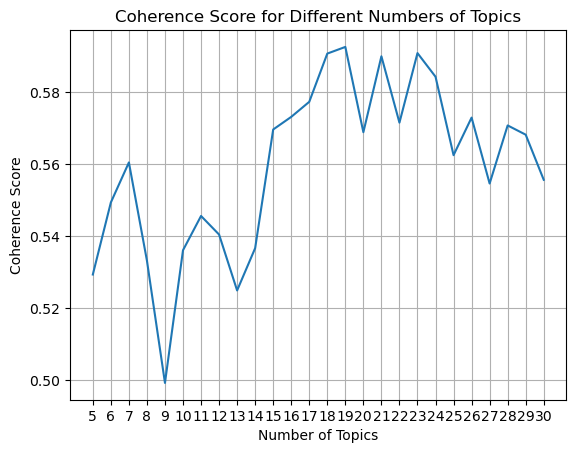

In [89]:
plt.plot(range(5, 31), coherence_scores)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.xticks(range(5, 31))
plt.grid(True)
plt.title("Coherence Score for Different Numbers of Topics")


Text(0.5, 1.0, 'Coherence Score for Different Numbers of Topics')

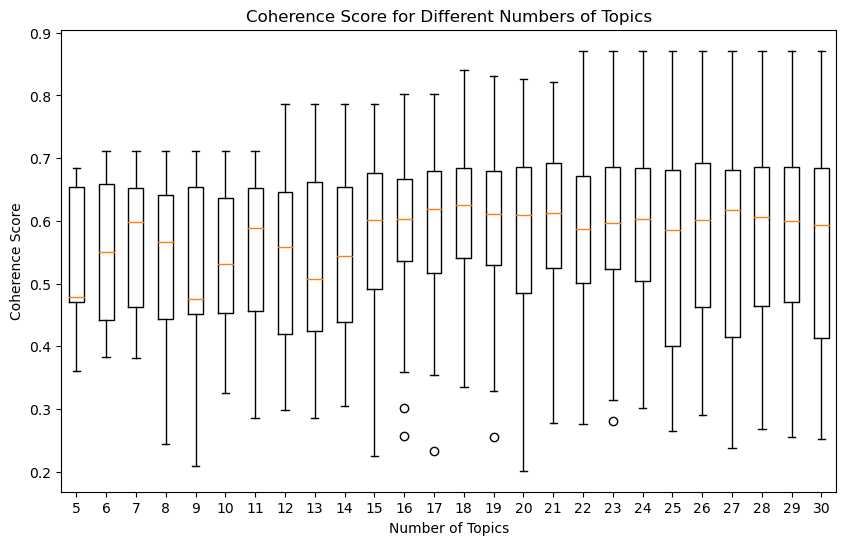

In [69]:
num_topics_range = range(5, 31)
plt.figure(figsize=(10, 6))
plt.boxplot(coherence_per_topic)
plt.xticks(ticks=range(1, len(num_topics_range) + 1), labels=num_topics_range)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.title("Coherence Score for Different Numbers of Topics")


In [88]:
print(max(coherence_scores))
print(coherence_scores.index(max(coherence_scores))+3)
print(coherence_scores[0])

0.592592213264437
18
0.5293701176589496


Text(0.5, 1.0, 'Perplexity Score for Different Numbers of Topics')

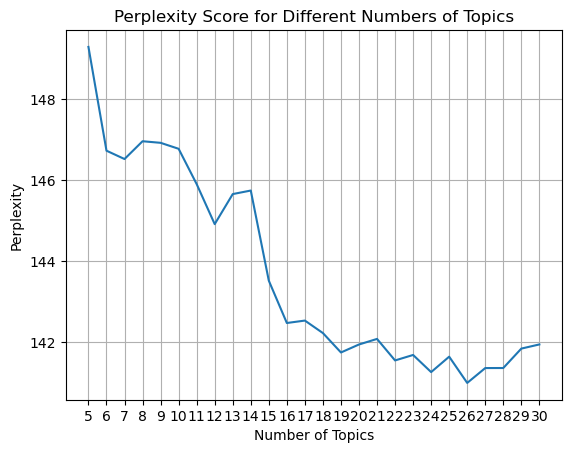

In [75]:
plt.plot(range(5, 31), perplexity_scores)
plt.xlabel("Number of Topics")
plt.ylabel("Perplexity")
plt.xticks(range(5, 31))
plt.grid(True)
plt.title("Perplexity Score for Different Numbers of Topics")


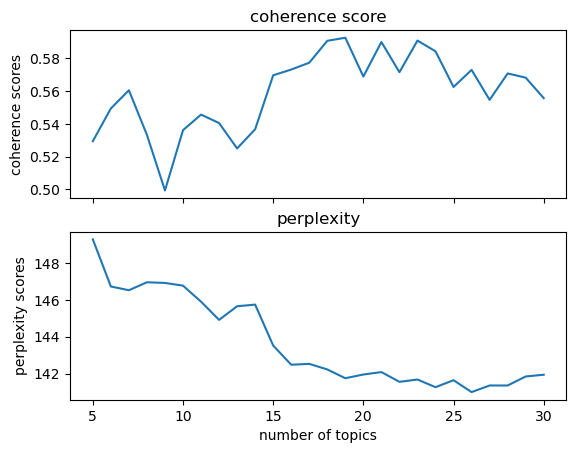

In [13]:
x = range(5,31)
fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True)
ax[0].plot(x, coherence_scores)
# ax[0].set_xlabel('number of topics')
ax[0].set_ylabel('coherence scores')
ax[0].set_title('coherence score')
ax[1].plot(x, perplexity_scores)
ax[1].set_xlabel('number of topics')
ax[1].set_ylabel('perplexity scores')
ax[1].set_title('perplexity')
plt.show()